<H1 size =10><center>MBD-PT 2023 Social Network Analysis  </center></H1>
<HR></HR>
<H2 size =7><center> IMDB Movie Network Anylsis </center></H2>

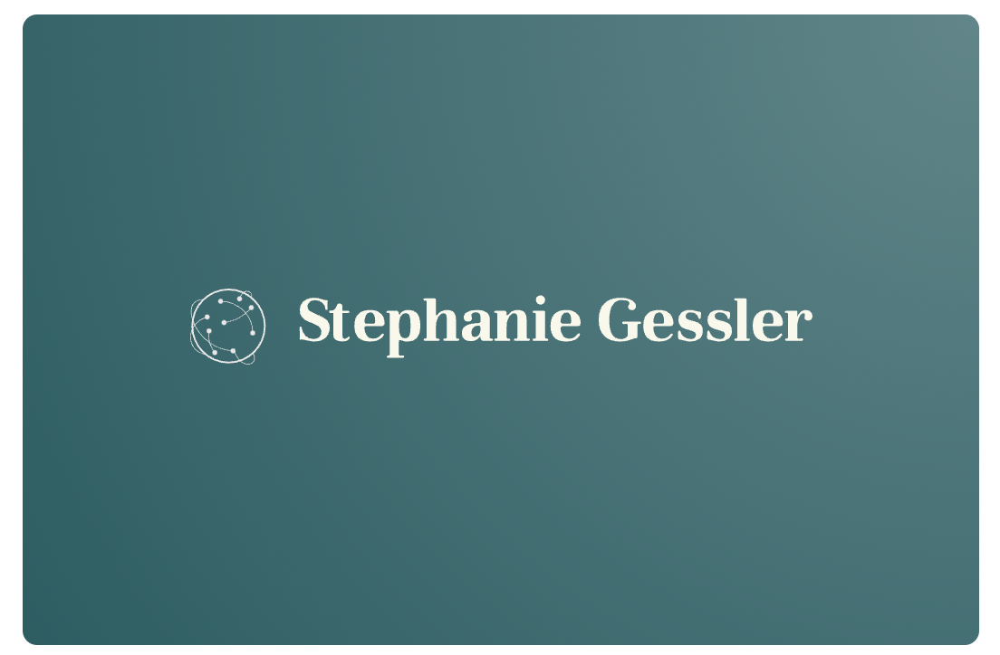

# <font color='#1A846B' size="6"><b>Table of contents</b></font> <br>

* [0. Description & General Objective](#0)
* [1. Import Libraries) ](#1)
* [2. Import Datasets](#2)
* [3. Graph Creation](#3)
  * [3.1) Create Graph in igraph](#3.1)   
  * [3.2 Create Graph in Networkx](#3.2)
* [4. Summary Statistics](#4)
    * [4.1) How many nodes are there?](#4.1)   
    * [4.2) How many edges are there?](#4.2)
    * [4.3) Add Statistics](#4.3)   
* [5. Degree Distribution](#5)
    * [5.1) How does this distributions look like?](#5.1)
    * [5.2) What is the maximum degree?](#5.2)
    * [5.3) What is the minimum degree?](#6)
* [6.Network Diameter and Average Path Length](#6)
    * [6.1) What is the diameter of the graph?](#6.1)
    * [6.2) What is the avg path length of the graph?)](#6.2)
* [7.Node importance: Centrality measures](#7)
    * [7.1) Distribution of number of movies](#7.1)
    * [7.2 Number of Genres of the actors](#7.2)
    * [7.3) Obatin Vectors with degree, betweeness and closeness )](#7.3)
* [8.Degree, Betweeness & Closeness](#8)
    * [8.1) Who is the actor with highest degree centrality?](#8.1)
    * [8.2) How do you explain the high degree of the top-20 list??](#8.2)
    * [8.3) Who is the actor with highest betweenes?](#8.3)
    * [8.4) How do you explain the high betweenness of the top-20 list?](#8.4)
    * [8.5) Who is the actor with highest closeness centrality?](#8.1)
    * [8.6) How do you explain the high closeness of the top-20 list?](#8.2)
* [9.Community Detection](#9)

<a id='0'></a>
<h1 align="left"><font size="5" color='#1A846B'> <b>  0.Instructions </b><br></font></h1> 

On this first assignment, applying the basic functions of the Igraph package is required. The following datasets are going to be used:

* Actors dataset - undirected graph - : For the 2005 Graph Drawing conference a data set was provided of the IMDB movie database. We will use a reduced version of this dataset, which derived all actor-actor collaboration edges where the actors co-starred in at least 2 movies together between 1995 and 2004. 


You have to complete the code chunks in this document but also analyze the results, extract insights and answer the short questions. Fill the CSV attached with your answers, sometimes just the number is enough, some others just a small sentence or paragraph. Remember to change the header with your email.

In your submission please upload both this document in HTML and the CSV with the solutions.



<a id='1'></a>
<h1 align="left"><font size="5" color='#1A846B'><b>  1. Import Libraries </b><br></font></h1>

In [38]:
!pip install jupyter_contrib_nbextensions
!pip install python-igraph
!apt-get install libcairo2-dev libjpeg-dev libgif-dev
!pip install pycairo
!pip install cairocffi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libcairo2-dev is already the newest version (1.16.0-4ubuntu1).
libgif-dev is already the newest version (5.1.9-1).
libjpeg-dev is already the newest version (8c-2ubuntu8).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [39]:
import networkx as nx

import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

import io

import igraph as ig
from igraph import Graph, EdgeSeq

import numpy as np

import plotly.graph_objects as go
import plotly.graph_objs as go
import plotly.io as pio
import plotly.express as px
import plotly.subplots as sp

import cairo
import cairocffi as cairo

import statistics


<a id='2'></a>
<h1 align="left"><font size="5" color='#1A846B'>  <b>2. Import Dataset</b><br> </font></h1>

In this section, the goal is loading the datasets given, building the graph and analyzing basics metrics. Include the edge or node attributes you consider.Describe the values provided by summary function on the graph object.


In [40]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [41]:
# Read files
#file = '/content/drive/MyDrive/imdb_actors_key_sol (1).csv'
file ='/content/drive/MyDrive/imdb_actors_key_sol (1).csv'


nodes = pd.read_csv(file,sep=';')
nodes.head()

,id,ActorName,movies_95_04,main_genre,genres
0,n15629,"Rudder, Michael (I)",12,Thriller,"Action:1,Comedy:1,Drama:1,Fantasy:1,Horror:1,N..."
1,n5026,"Morgan, Debbi",16,Drama,"Comedy:2,Documentary:1,Drama:6,Horror:2,NULL:3..."
2,n11252,"Bellows, Gil",33,Drama,"Comedy:6,Documentary:1,Drama:7,Family:1,Fantas..."
3,n5150,"Dray, Albert",20,Comedy,"Comedy:6,Crime:1,Documentary:1,Drama:4,NULL:5,..."
4,n4057,"Daly, Shane (I)",18,Drama,"Comedy:2,Crime:1,Drama:7,Horror:1,Music:1,Musi..."


In [ ]:
# Locally Read the csv file into dataframe 

#3df = pd.read_csv('/Users/stephaniegessler/Downloads/imdb_actors_key_sol (1).csv',sep=';')
#df.head()


In [ ]:
# locally Read the csv file into dataframe 
#df_key= pd.read_csv('/Users/stephaniegessler/Downloads/imdb_actor_edges_sol (1).csv',sep=';')
#df_key.head()

In [42]:
# Read files

#file = 'drive/MyDrive/imdb_actor_edges_sol (1).csv'
file = '/content/drive/MyDrive/imdb_actor_edges_sol (1).csv'
edges = pd.read_csv(file,sep=';')
edges = edges.rename(columns={'from': 'source', 'to': 'target'})
edges.head()

,source,target,weight
0,n17776,n17778,6
1,n5578,n9770,3
2,n5578,n929,2
3,n5578,n9982,2
4,n1835,n6278,2


<a id='2'></a>
<h1 align="left"><font size="4" color='#1A846B'>  <b>Inverse Weight</b><br> </font></h1>

In graph theory, the weight of an edge is typically used to represent the cost or distance between two nodes. When computing the shortest path between two nodes in a graph, the algorithm tries to **find the path with the minimum weight**.

However, in some cases, it may be more intuitive to think of a **larger weight as indicating a stronger connection between two nodes**. In these cases, taking the **inverse of the weight  1/weight** can be useful. This way, **larger weights result in smaller values,** and vice versa.

If we are modeling the social network of the actors where the weight of an edge represents **the strength of a relationship** between two people, a larger weight could indicate a stronger relationship since they worked together in more movies together. In this case, taking the inverse of the weight would mean that larger weights, the stronger relationship would result in shorter distances in the graph, which would align more with our intuition.

In [43]:
# create a new dataframe for the edges
edges_inverse = edges[['source', 'target', 'weight']].copy()

# calculate the inverse of the weight column
edges_inverse ['weight'] = edges['weight'].apply(lambda x: 1/x)

edges_inverse.head()

,source,target,weight
0,n17776,n17778,0.166667
1,n5578,n9770,0.333333
2,n5578,n929,0.500000
3,n5578,n9982,0.500000
4,n1835,n6278,0.500000


In [ ]:
#statistics of df
nodes.describe()

,movies_95_04
count,17577.000000
mean,20.545258
std,20.686926
min,10.000000
25%,12.000000
50%,15.000000
75%,22.000000
max,540.000000


There are 17577 nodes in the graph but we will see this later. 
On average, each node is in 20.54 movies from the period 1995-2004.
The standard deviation of the number of movies each node is in is 20.69, indicating a relatively wide range of values as the minimum number of movies a node is in is 10, while the maximum is 540.

In [ ]:
value_counts =nodes['main_genre'].value_counts()

print(value_counts)

Drama        7302
Comedy       2928
Adult        1811
Romance      1027
Thriller      947
Crime         711
Music         631
Action        537
Sci-Fi        421
Family        359
Animation     284
Horror        171
Fantasy       137
War            69
Mystery        66
Adventure      63
Western        24
Musical        21
Name: main_genre, dtype: int64


The top three movies in the main genre are Drama, Comedy and Adult for most actors. 

17577 actors are in the dataset, which can be validated counting the Id numbers

In [ ]:
value_counts = nodes.groupby(['id']).size().count()
value_counts 

17577

For further anylyis the genres are Split into seperate columns, we keep also NULL as there are high number of actors which indenticates in genre NULL. 

In [44]:
# Split the 'genres' column by ',' to create separate columns for each genre
genres_df = nodes['genres'].str.split(',', expand=True)
# Extracts the unique genre keys  and splits the genre count by ":". Flatten helps to make a single array and set makes it unique 
genres_keys = set(genres_df.apply(lambda x: x.str.split(':', expand=True)[0]).values.flatten())
#Remove None and Null 
genres_keys.remove(None)
#genres_keys.remove('NULL')
print(genres_keys)


df_with_genres = nodes.copy().drop('genres', axis=1)
# The function extracts the count of a specific genre in a string of genres and their respective counts
def get_genre_count(x, genre):
    genre_counts = x.split(',')
    for genre_count in genre_counts:
        if genre_count.split(':')[0] == genre:
            return genre_count.split(':')[1]
    return 0

for genre in genres_keys:
    df_with_genres[genre] = nodes['genres'].apply(lambda x: get_genre_count(x, genre))

df_with_genres.head()

{'Music', 'Animation', 'Action', 'Crime', 'Horror', 'Comedy', 'Adult', 'Documentary', 'Drama', 'Romance', 'Sci-Fi', 'Thriller', 'Western', 'Mystery', 'NULL', 'Family', 'Short', 'Fantasy', 'Adventure', 'War', 'Musical'}


,id,ActorName,movies_95_04,main_genre,Music,Animation,Action,Crime,Horror,Comedy,Adult,Documentary,Drama,Romance,Sci-Fi,Thriller,Western,Mystery,NULL,Family,Short,Fantasy,Adventure,War,Musical
0,n15629,"Rudder, Michael (I)",12,Thriller,0,0,1,0,1,1,0,0,1,1,1,2,0,0,2,0,0,1,0,1,0
1,n5026,"Morgan, Debbi",16,Drama,0,0,0,0,2,2,0,1,6,2,0,0,0,0,3,0,0,0,0,0,0
2,n11252,"Bellows, Gil",33,Drama,0,0,0,0,1,6,0,1,7,6,0,4,0,2,2,1,2,1,0,0,0
3,n5150,"Dray, Albert",20,Comedy,0,0,0,1,0,6,0,1,4,1,0,1,0,0,5,0,1,0,0,0,0
4,n4057,"Daly, Shane (I)",18,Drama,1,0,0,1,1,2,0,0,7,1,0,4,0,0,0,0,0,0,0,0,1


Min weight is 2 and the maxium is 118 weight, but the mean is 3.18 as weight for the edges.

In [ ]:
edges.describe()

,weight
count,287074.000000
mean,3.281206
std,2.991388
min,2.000000
25%,2.000000
50%,2.000000
75%,3.000000
max,118.000000


Based on these results, we can conclude that the majority of edges have a weight of 2 or 3, with 50% quantiles of the edges having a weight of 2. There are some edges with a high weight (up to 118), but these are likely to be outliers. Overall, the weights of the edges in the graph seem to be relatively low, indicating that there are not many strong connections between the nodes.

In [ ]:
value_counts = edges.groupby(['source', 'target']).size().count()

print(value_counts)

287074


<a id='3.1'></a>
<h1 align="left"><font size="5" color='#1A846B'>  3. Create Graphs </font></h1>

<a id='3.1'></a>
<h1 align="left"><font size="4" color='#1A846B'>  3. Create Graph in igraph </font></h1>

In [45]:
g = ig.Graph()

g = Graph.DataFrame(edges=edges, vertices=df_with_genres, directed=False, use_vids=False)

In [46]:
g_inv = ig.Graph()

g_inv = Graph.DataFrame(edges=edges_inverse, vertices=df_with_genres, directed=False, use_vids=False)

In [ ]:
print(g.summary())

IGRAPH UNW- 17577 287074 -- 
+ attr: Action (v), ActorName (v), Adult (v), Adventure (v), Animation (v), Comedy (v), Crime (v), Documentary (v), Drama (v), Family (v), Fantasy (v), Horror (v), Music (v), Musical (v), Mystery (v), NULL (v), Romance (v), Sci-Fi (v), Short (v), Thriller (v), War (v), Western (v), main_genre (v), movies_95_04 (v), name (v), weight (e)




*   The first line specifies that the graph is undirected (UNW) and contains 17,577 vertices (nodes) and 287,074 edges.
*   The attr lines indicate the attributes associated with each vertex (node) in the graph. Each attribute represents a movie genre or a property of the actor like the actor's name.
*   The weight attribute associated with each edge is also shown in the output.




In [ ]:
ig.plot(g, bbox=(1000, 600),vertex_color='green', target='myplot.png')

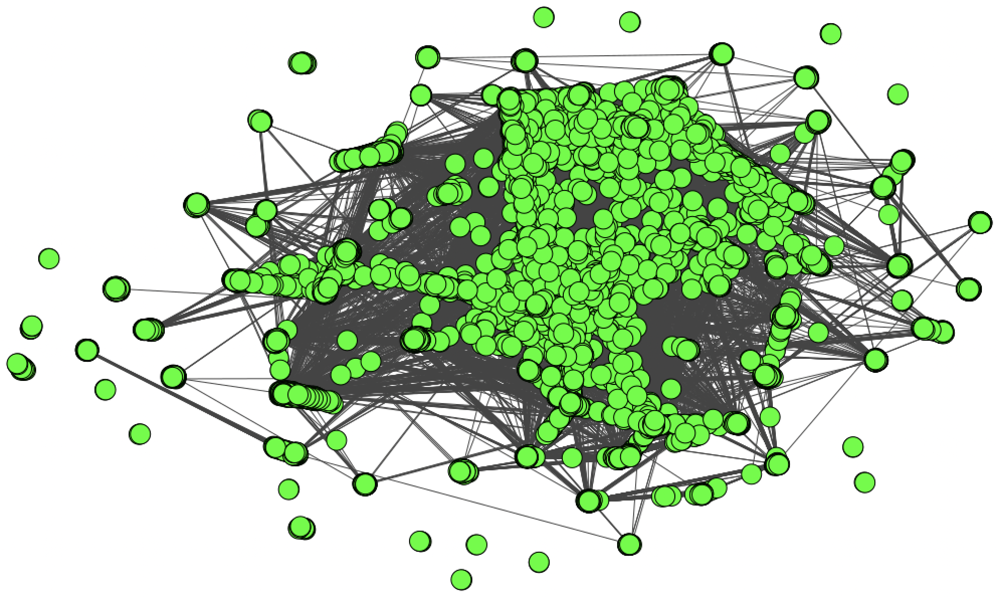

In the graph you see that  not all nodes are connected (**disconnected graph**). In a disconnected graph, there are one or more sets of nodes that have no edges connecting them to any other nodes in the graph. 
This creates **isolated** clusters or components of nodes.

Two groups of actors who have no actors link in common, they would form two disconnected components in the graph.

<a id='3.2'></a>
<h1 align="left"><font size="5" color='#1A846B'>  3.2 Create Graph in Networkx </font></h1>

In [ ]:
# create an empty NetworkX graph
G = nx.Graph()

# add nodes to the graph
G.add_nodes_from(nodes['id'])

# add edges to the graph with weights
for index, row in edges.iterrows():
    G.add_edge(row['source'], row['target'], weight=row['weight'])

In [ ]:
from pyvis.network import Network
# create a PyVis network object
net = Network(height='750px', width='100%', bgcolor='#222222', font_color='white')
net.from_nx(G)
net.show('mygraph.html')

In [ ]:
# Iterate over the rows of the nodes dataframe
for i, row in nodes.iterrows():
    # Add the node to the graph with attributes
    G.add_node(row['id'], ActorName=row['ActorName'], movies_95_04=row['movies_95_04'], main_genre=row['main_genre'], genres=row['genres'])


The **connected components** gives you the number of subgraphs, where there is a path between any two nodes. Since we have **19 subgraphs**, all nodes in a connected component can be reached from any other node in the same component. If a graph has only one connected component, then it is a connected graph. If a graph has more than one connected component, then it is a disconnected graph.

In [ ]:
nx.number_connected_components(G)

19

In [ ]:
# Get the connected components
components = g.clusters()

# Print the size and membership of each component
for i, c in enumerate(components):
    print(f"Component {i} has size {len(c)} and contains vertices {c}")

Component 0 has size 17455 and contains vertices [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213

<ipython-input-33-b0350cd9ff9f>:2: DeprecationWarning:

Graph.clusters() is deprecated; use Graph.connected_components() instead




<a id='4'></a>
<h1 align="left"><font size="5" color='#1A846B'>  4. Summary Statistics </font></h1>

<a id='4.2'></a>
<h1 align="left"><font size="4" color='#1A846B'>  4.1. How many nodes are there? </font></h1>
<h1 align="left"><font size="4" color='#1A846B'>  4.2. How many edges are there? </font></h1>

Overall the entire graph consists of 17577 nodes and 28704 edges, where subgraph 1 has 99% of the nodes and edges. 

In [ ]:
# Compute some basic metrics of the entire graph 
print(g.summary())
print("Number of nodes:", len(g.vs))
print("Number of edges:", len(g.es))

IGRAPH UNW- 17577 287074 -- 
+ attr: Action (v), ActorName (v), Adult (v), Adventure (v), Animation (v), Comedy (v), Crime (v), Documentary (v), Drama (v), Family (v), Fantasy (v), Horror (v), Music (v), Musical (v), Mystery (v), NULL (v), Romance (v), Sci-Fi (v), Short (v), Thriller (v), War (v), Western (v), main_genre (v), movies_95_04 (v), name (v), weight (e)
Number of nodes: 17577
Number of edges: 287074


In [ ]:
#Now looking at the subgraphs create the list of subgraphs
subgraphs = g.decompose()

In [ ]:
# create the list of subgraphs for the inverse
subgraphs_inv = g_inv.decompose()

In [57]:
for i, sg in enumerate(subgraphs):
    print(f"Subgraph {i+1}:")
    print(f"Number of nodes: {sg.vcount()}")
    print(f"Number of edges: {sg.ecount()}")

Subgraph 1:
Number of nodes: 17455
Number of edges: 286911
Subgraph 2:
Number of nodes: 22
Number of edges: 30
Subgraph 3:
Number of nodes: 23
Number of edges: 28
Subgraph 4:
Number of nodes: 4
Number of edges: 6
Subgraph 5:
Number of nodes: 33
Number of edges: 55
Subgraph 6:
Number of nodes: 2
Number of edges: 1
Subgraph 7:
Number of nodes: 3
Number of edges: 2
Subgraph 8:
Number of nodes: 11
Number of edges: 27
Subgraph 9:
Number of nodes: 2
Number of edges: 1
Subgraph 10:
Number of nodes: 3
Number of edges: 3
Subgraph 11:
Number of nodes: 2
Number of edges: 1
Subgraph 12:
Number of nodes: 2
Number of edges: 1
Subgraph 13:
Number of nodes: 2
Number of edges: 1
Subgraph 14:
Number of nodes: 2
Number of edges: 1
Subgraph 15:
Number of nodes: 3
Number of edges: 2
Subgraph 16:
Number of nodes: 2
Number of edges: 1
Subgraph 17:
Number of nodes: 2
Number of edges: 1
Subgraph 18:
Number of nodes: 2
Number of edges: 1
Subgraph 19:
Number of nodes: 2
Number of edges: 1


Subgraph 1 has the most edges and nodes,the remaining have few or just single edges.

In [ ]:
#identify the biggest subgraph 
largest_subgraph = max(subgraphs, key=lambda subgraph: len(subgraph.vs))
print("Largest subgraph index:", subgraphs.index(largest_subgraph))
print("Number of vertices in largest subgraph:", len(largest_subgraph.vs))


Largest subgraph index: 0
Number of vertices in largest subgraph: 17455


<h1 align="left"><font size="4.3" color='#1A846B'>  4.3. Add Statistics </font></h1>

<a id='2'></a>
<h1 align="left"><font size="4" color='#1A846B'>  <b>Average Degree</b><br> </font></h1>

In [78]:
# Iterate over subgraphs and calculate their average degree
for i, subgraph in enumerate(subgraphs):
    avg_degree = sum(subgraph.degree())/len(subgraph.degree())
    print(f"The average degree of subgraph {i+1} is: {avg_degree}")

The average degree of subgraph 1 is: 32.87436264680607
The average degree of subgraph 2 is: 2.727272727272727
The average degree of subgraph 3 is: 2.4347826086956523
The average degree of subgraph 4 is: 3.0
The average degree of subgraph 5 is: 3.3333333333333335
The average degree of subgraph 6 is: 1.0
The average degree of subgraph 7 is: 1.3333333333333333
The average degree of subgraph 8 is: 4.909090909090909
The average degree of subgraph 9 is: 1.0
The average degree of subgraph 10 is: 2.0
The average degree of subgraph 11 is: 1.0
The average degree of subgraph 12 is: 1.0
The average degree of subgraph 13 is: 1.0
The average degree of subgraph 14 is: 1.0
The average degree of subgraph 15 is: 1.3333333333333333
The average degree of subgraph 16 is: 1.0
The average degree of subgraph 17 is: 1.0
The average degree of subgraph 18 is: 1.0
The average degree of subgraph 19 is: 1.0


The average degree is a measure of the average number of edges connected to each node in the subgraph.

The output shows the results of the calculation for each subgraph. The interpretation of the results is that some subgraphs have a relatively high average degree, such as subgraph 1 with an average degree of 32.87, while others have a very low average degree, such as subgraphs 6, 9, 11, 12, 13, 14, 16, 17, 18, and 19, which all have an average degree of 1.0. This suggests that the nodes in these subgraphs have very few edges compared to the nodes in subgraph 1. The analysis of average degree in subgraphs could help to identify important subgraphs in the network.

<a id='2'></a>
<h1 align="left"><font size="4" color='#1A846B'>  <b>Basic Statistics: Density, Triangles, Modularity, Eccentricity,  Assortativity, Clique Number</b><br> </font></h1>

In [58]:
for i, sg in enumerate(subgraphs):
    print(f"Subgraph {i+1}:")
    print(f"Density: {sg.density()}")
    print(f"Triangles: {len(sg.cliques(min=3, max=3))}")
    print(f"Modularity: {sg.modularity(sg.community_fastgreedy().as_clustering())}")
    print(f"Eccentricity: {max(sg.eccentricity())}")
    print(f"Assortativity: {sg.assortativity_degree(directed=False)}")
    print(f"Clique Number: {sg.clique_number()}")
    print("------------------------------")

Subgraph 1:
Density: 0.0018834858855738552
Triangles: 3547243
Modularity: 0.7878293538160316
Eccentricity: 16.0
Assortativity: 0.29305462580433556
Clique Number: 143
------------------------------
Subgraph 2:
Density: 0.12987012987012986
Triangles: 8
Modularity: 0.48444444444444446
Eccentricity: 8.0
Assortativity: -0.07816711590296527
Clique Number: 4
------------------------------
Subgraph 3:
Density: 0.1106719367588933
Triangles: 1
Modularity: 0.49298469387755095
Eccentricity: 6.0
Assortativity: -0.2822545134302065
Clique Number: 3
------------------------------
Subgraph 4:
Density: 1.0
Triangles: 4
Modularity: 0.0
Eccentricity: 1.0
Assortativity: nan
Clique Number: 4
------------------------------
Subgraph 5:
Density: 0.10416666666666667
Triangles: 15
Modularity: 0.4907438016528925
Eccentricity: 8.0
Assortativity: 0.1029774322017813
Clique Number: 4
------------------------------
Subgraph 6:
Density: 1.0
Triangles: 0
Modularity: 0.0
Eccentricity: 1.0
Assortativity: nan
Clique Number

*   **Density**:A  measure of how well connected the nodes are in a graph. It is defined as the ratio of the number of edges in the graph to the maximum number of edges possible in a graph with the same number of nodes.The density of a graph can range from 0 to 1, where a density of 0 means that there are no edges in the graph, and a density of 1 means that every possible edge is present in the graph.In general, a higher density can indicate a more connected and cohesive network, while a lower density can indicate a more sparse or fragmented network. However, the interpretation can vary depending on the specific application and the characteristics of the graph. As you can see subgraph 1 is very low connected due to the big network it has

*  **Triangle** count for each subgraph, which is the number of cycles of length 3 in the graph. It is an important metric for measuring the **level of connectivity** between nodes in a graph, and is related to the concept of clustering.From the output, we can see that the largest subgraph (Subgraph 1) has a low density, meaning that it is relatively sparse, but it has a **high number of triangles**, indicating a high level of clustering among the nodes. In contrast, some of the smaller subgraphs have a higher density, but a lower number of triangles, suggesting a lower level of clustering.

*   **Modularity**: A measure of the density of links within modules or communities in the graph. A modularity of 0 indicates that the graph is random, whereas a modularity of 1 indicates that the graph is completely modular. In this case, the subgraph 1 has a high modularity of 0.8, indicating that the nodes are densly connected and for the other subgraphs are not organized into distinct communities. 

*   **Eccentricity**: The maximum distance between a node and all other nodes in the subgraph. In Subgraph 1, the maximum distance is 16, which means that the subgraph is relatively large and spread out, which some nodes far apart. In comparison to the others with 1 are directly connected. 

*   **Assortativity**: This measures the degree to which nodes in the subgraph tend to be connected to other nodes with a similar degree. A value of 0.293 suggests that there is some tendency for nodes in  subgraph 1 to be connected to other nodes with a similar degree, but it is not a very strong effect

*   **Clique Number:** This is the size of the largest clique (fully connected subgraph) within the subgraph 1. A value of 143 suggests that there is a very large clique within this subgraph, which may indicate the presence of a highly connected group of nodes, while the other graohs are very low in number  e.g of 2 suggest the largest clique consists of two nodes. 

<a id='2'></a>
<h1 align="left"><font size="4" color='#1A846B'>  <b>Basic Statictis by vertices: Degree, Betweeness, pagerank, Eigenvector, closeness with inverse weight and without weight</b><br> </font></h1>



*   **Weight** is an important factor in measuring the closeness between two nodes because it takes into account the strength of the connection between them. In a weighted graph, the closer two nodes are, the higher their weight is, indicating a **stronger connection** between them.

*   Weight also affects the calculation of **Betweenness centrality**, which measures the importance of a node in terms of the number of shortest paths that pass through it. If a weighted graph has high-weight edges, then the betweenness centrality of nodes that are on those edges will be higher than the nodes that are on low-weight edges.

*   Similarly, the impact of weight on the **PageRank algorithm**, which measures the importance of nodes in a network based on the number and quality of links to them. In a weighted graph, the PageRank of a node that is connected to high-weight nodes will be higher than that of a node that is connected to low-weight nodes.

*   Weight also affects the calculation of **Eigenvector centrality**, which measures the importance of a node based on its connections to other important nodes in the network. In a weighted graph, a node that is connected to high-weight nodes will have a higher eigenvector centrality than a node that is connected to low-weight nodes.

*   Weight is also an important factor in measuring the closeness of nodes in a graph. In a weighted graph, the closeness between two nodes takes into account the weight of the edges connecting them, which means that nodes that are connected by **high-weight edges will have a smaller distance between them than nodes that are connected by low-weight edges**.

*   **Coreness**: A measure of the level of connectedness of the nodes in the subgraph, where nodes with a higher coreness value are more strongly connected to other nodes in the subgraph, no weight measure is here needed. 



In [47]:
# Calculate the degree, betweenness centrality, pagerank, eigenvector centrality, and closeness centrality 
#and use for the one the inverse graph since we want to display the relationship correctly
#degree = g_inv.degree(directed =False)
betweenness = g_inv.betweenness(weights='weight', directed =False, cutoff=None)
pagerank = g_inv.pagerank(weights='weight',directed =False)
eigenvector = g_inv.eigenvector_centrality(weights='weight',directed =False)
closeness = g_inv.closeness(weights='weight', normalized=True, mode= "all",vertices= g_inv.vs)

# Add the calculated metrics to the node dataframe
#df_with_genres['degree'] = degree
df_with_genres['betweenness_weigth'] = betweenness
df_with_genres['pagerank_weigth'] = pagerank
df_with_genres['eigenvector_weight'] = eigenvector
df_with_genres['closeness_weight'] = closeness

# Add a column with the neighbors for each node
neighbors = [g_inv.neighbors(node_id) for node_id in g_inv.vs['name']]
df_with_genres['neighbors'] = neighbors

df_with_genres.sort_values(by='betweenness_weigth', ascending=False).head(1)


,id,ActorName,movies_95_04,main_genre,Music,Animation,Action,Crime,Horror,Comedy,Adult,Documentary,Drama,Romance,Sci-Fi,Thriller,Western,Mystery,NULL,Family,Short,Fantasy,Adventure,War,Musical,betweenness_weigth,pagerank_weigth,eigenvector_weight,closeness_weight,neighbors
12147,n162,"Davis, Mark (V)",540,Adult,0,0,1,1,0,3,429,5,6,0,1,0,0,0,92,0,1,1,0,0,0,1.703766e+07,0.000427,0.980388,0.835476,"[83, 86, 104, 131, 137, 139, 142, 181, 184, 29..."


In [48]:
# Calculate the degree, betweenness centrality, pagerank, eigenvector centrality, and closeness centrality 
#and use for the one the inverse graph since we want to display the relationship correctly
degree = g.degree()
betweenness = g.betweenness(directed =False)
closeness = g.closeness(normalized= True, mode= "all",vertices= g.vs)
coreness = g.coreness()

# Add the calculated metrics to the node dataframe
df_with_genres['degree'] = degree
df_with_genres['betweenness'] = betweenness
df_with_genres['closeness'] = closeness
df_with_genres['coreness']= coreness

df_with_genres.sort_values(by='betweenness', ascending=False).head(1)


,id,ActorName,movies_95_04,main_genre,Music,Animation,Action,Crime,Horror,Comedy,Adult,Documentary,Drama,Romance,Sci-Fi,Thriller,Western,Mystery,NULL,Family,Short,Fantasy,Adventure,War,Musical,betweenness_weigth,pagerank_weigth,eigenvector_weight,closeness_weight,neighbors,degree,betweenness,closeness,coreness
10548,n2108,"Jeremy, Ron",280,Adult,2,1,0,0,9,15,149,26,15,3,8,3,0,0,43,0,4,0,1,0,1,1.487206e+07,0.000465,0.752032,0.836407,"[83, 104, 131, 183, 199, 216, 301, 345, 365, 4...",471,9.748544e+06,0.28272,77


Add the subgraph number to the dataframe 

In [49]:
subgraph_num_list = []
for i in range(len(df_with_genres)):
    node_id = df_with_genres.iloc[i]['id']
    for j, subgraph in enumerate(subgraphs):
        if node_id in subgraph.vs['name']:
            subgraph_num_list.append(j)
            break


In [50]:
df_with_genres['subgraph_num'] = subgraph_num_list


In [51]:
df_with_genres.sort_values(by='betweenness', ascending=False).head()

,id,ActorName,movies_95_04,main_genre,Music,Animation,Action,Crime,Horror,Comedy,Adult,Documentary,Drama,Romance,Sci-Fi,Thriller,Western,Mystery,NULL,Family,Short,Fantasy,Adventure,War,Musical,betweenness_weigth,pagerank_weigth,eigenvector_weight,closeness_weight,neighbors,degree,betweenness,closeness,coreness,subgraph_num
10548,n2108,"Jeremy, Ron",280,Adult,2,1,0,0,9,15,149,26,15,3,8,3,0,0,43,0,4,0,1,0,1,1.487206e+07,0.000465,7.520318e-01,0.836407,"[83, 104, 131, 183, 199, 216, 301, 345, 365, 4...",471,9.748544e+06,0.282720,77,0
4693,n3284,"Chan, Jackie (I)",59,Comedy,1,0,2,4,1,13,0,18,0,2,0,3,0,0,4,3,7,1,0,0,0,5.217806e+06,0.000215,2.028330e-03,0.837658,"[67, 228, 269, 732, 775, 855, 926, 1090, 1145,...",135,4.716909e+06,0.287238,51,0
2563,n564,"Cruz, Penélope",46,Drama,3,0,0,0,0,2,0,5,6,6,0,2,3,2,3,5,5,0,1,3,0,9.200956e+06,0.000270,2.370663e-03,0.865430,"[25, 59, 67, 147, 368, 586, 617, 708, 799, 926...",182,4.330663e+06,0.295555,56,0
14433,n14458,"Shahlavi, Darren",16,Action,0,0,4,0,1,3,0,1,1,0,1,3,0,0,0,0,1,1,0,0,0,4.285954e+06,0.000040,2.510683e-07,0.500483,"[2041, 2738, 3193, 4487, 14424, 14526, 15326, ...",8,4.295503e+06,0.193886,6,0
15720,n17308,"Del Rosario, Monsour",20,Action,0,0,8,0,2,0,0,0,3,1,1,2,0,0,1,0,0,1,0,1,0,4.267096e+06,0.000029,2.301942e-09,0.402604,"[7672, 10735, 14433, 15280, 15295, 15989]",6,4.267099e+06,0.163154,5,0


<a id='2'></a>
<h1 align="left"><font size="4" color='#1A846B'>  <b>Print in PNG the subgraphs </b><br> </font></h1>

 

*   Export the 19 Graphs in PNG to view the different structures 
*   Many subgraphs consists of only two nodes



In [ ]:
# Print each subgraph to a PNG file
for i, subgraph in enumerate(subgraphs):
    filename = f"subgraph_{i+1}.png"
    subgraph.vs['label'] = subgraph.vs['name']
    ig.plot(subgraph, target=filename)

Only the most different graphs are shows, the subgraphs which are missing are literally only two nodes like subgraph 6. 

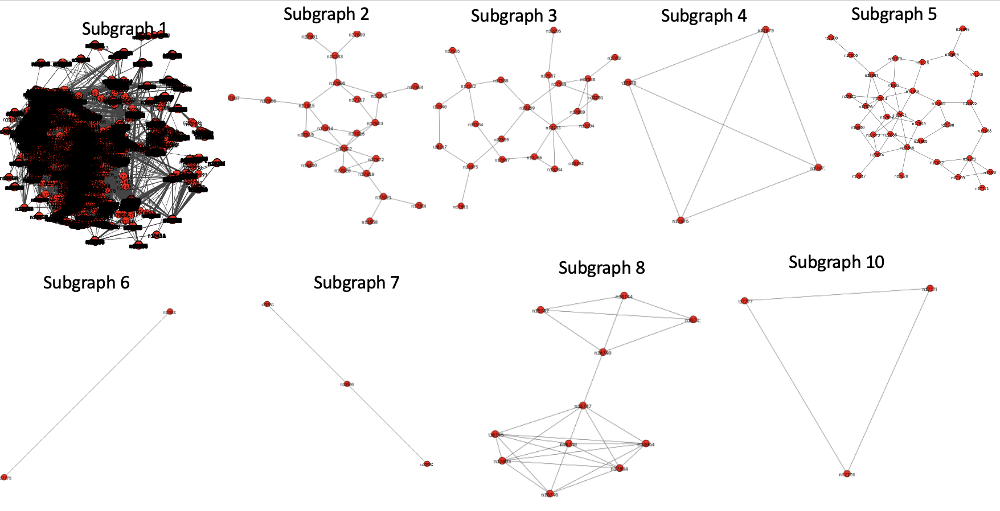

<a id='5'></a>
<a id='5.1'></a>
<h1 align="left"><font size="5" color='#1A846B'>  5. Degree distribution</font></h1>

<a id='5.1'></a>
Analyse the degree distribution. Compute the total degree distribution.

<h1 align="left"><font size="4" color='#1A846B'>  5.1) How does this distributions look like? </font></h1>

This section shows degree distribution by counting the number of vertices with each degree. 
It prints the degree distribution for each subgraph

Degree distribution is a measure of the frequency of nodes with a certain degree in a network. The weight of the edges is not used in the calculation of degree distribution, as it only considers the number of edges connected to a node, i.e., the degree of the node. Therefore, weight is not used in degree distribution

In [ ]:
# Iterate over each subgraph
for i, subgraph in enumerate(subgraphs):

    # Compute the degree sequence
    degree_sequence = subgraph.degree()

    # Compute the degree distribution
    degree_count = {}
    for d in degree_sequence:
        degree_count[d] = degree_count.get(d, 0) + 1

    # Print the degree distribution
    print(f"Subgraph {i+1} degree distribution:", degree_count)

Subgraph 1 degree distribution: {36: 109, 23: 230, 22: 273, 46: 90, 18: 353, 5: 649, 6: 656, 57: 42, 11: 521, 7: 659, 93: 22, 47: 85, 25: 235, 19: 316, 107: 14, 1: 434, 8: 583, 123: 13, 78: 24, 74: 46, 34: 158, 24: 231, 30: 161, 2: 572, 26: 209, 13: 411, 16: 377, 21: 291, 9: 604, 51: 71, 29: 209, 66: 44, 56: 60, 3: 609, 84: 26, 61: 49, 102: 14, 31: 180, 4: 670, 28: 202, 12: 485, 145: 9, 15: 425, 14: 404, 289: 3, 83: 31, 92: 23, 37: 104, 10: 553, 44: 96, 43: 97, 345: 2, 27: 222, 45: 93, 54: 53, 160: 8, 174: 4, 118: 8, 144: 7, 20: 284, 105: 21, 97: 22, 77: 40, 32: 168, 59: 56, 104: 20, 90: 21, 33: 141, 146: 10, 87: 26, 52: 66, 70: 35, 49: 79, 71: 39, 53: 72, 86: 23, 82: 18, 35: 133, 60: 53, 81: 34, 181: 13, 17: 328, 68: 50, 184: 9, 162: 7, 94: 24, 39: 115, 179: 9, 41: 118, 147: 9, 50: 80, 216: 4, 40: 127, 180: 6, 42: 92, 190: 6, 241: 2, 157: 6, 131: 9, 55: 63, 80: 31, 63: 61, 99: 22, 194: 6, 76: 31, 140: 10, 125: 9, 392: 1, 438: 1, 38: 114, 79: 33, 73: 30, 72: 39, 58: 46, 231: 4, 65: 41,

*   The degree distribution of the subgraph 1 can be considered as the most **significant and outstanding** because it has the highest number of nodes and edges among all the subgraphs.
*   Subgraph 2: It is a connected graph. It can be considered as a **social network**. The degree distribution is heterogeneous, with some nodes having a very high degree, indicating influential people in the network
*  Subgraph 3: It is a connected graph. The degree distribution is homogeneous, with all nodes having a degree of either 1 or 2. It can be considered as a **small social group**
*   Subgraph 5: A high proportion of nodes with low degree (e.g. 1 or 2) may indicate a sparsely connected subgraph, while a high proportion of nodes with high degree may indicate a densely connected subgraph.
*   Subgraph 6/11-14,16-19: It is a **disconnected graph**. The degree distribution is homogeneous, with all nodes having a degree of 1. It can be considered as a set of **isolated individuals**.
*   Subgraph 8: There are no nodes in the subgraph with a degree lower than 3 or higher than 6.This degree distribution indicates that the subgraph is relatively dense and well-connected, with a majority of nodes having a high degree





In [80]:
# Get the subgraphs
subgraphs = g.decompose()

# Create a figure for the plot
fig = go.Figure()

# Iterate over each subgraph
for i, subgraph in enumerate(subgraphs):

    # Get the degree distribution
    degree_dist = subgraph.degree_distribution()

    # Convert the degree distribution to a list of tuples
    degree_dist = [(bin_left, count) for bin_left, _, count in degree_dist.bins()]

    # Sort the list of tuples by the bin left value
    degree_dist = sorted(degree_dist, key=lambda x: x[0])

    # Add a trace for the degree distribution of the current subgraph
    fig.add_trace(go.Scatter(x=[x[0] for x in degree_dist], y=[x[1] for x in degree_dist], mode='lines', name=f'Subgraph {i+1}'))

# Update the layout 
#fig.update_layout(xaxis_title='Degree', yaxis_title='Count', title='Degree distribution per subgraph')

# Show the plot
#fig.show()


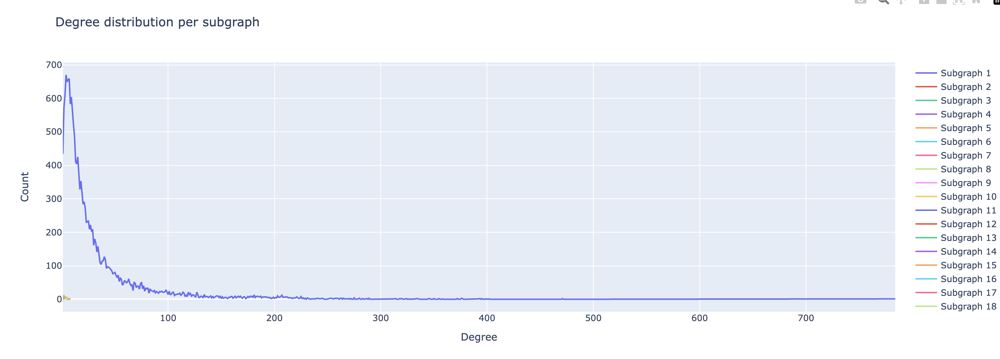

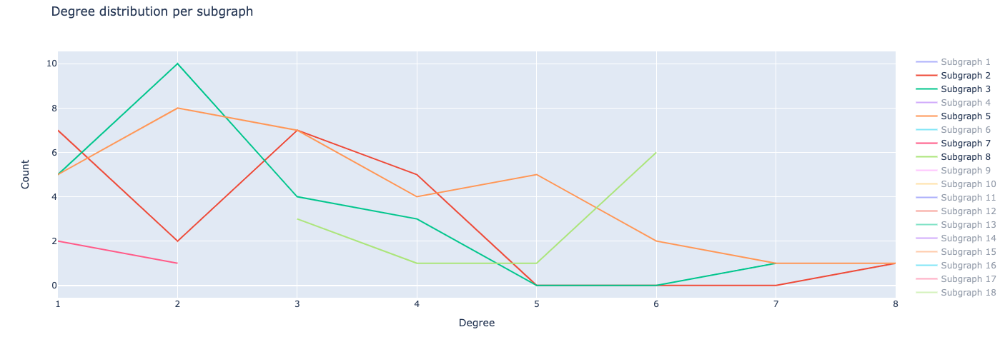

The degree distribution plot shows how many connections (or edges) each actor has in the network. On the x-axis, we have the degree of the nodes, and on the y-axis, we have the number of actors with that degree.

**In Subgraph 1 (blue line)**, we can observe that most actors have a small number of connections, with a peak of 670 actors having only 4 degrees/ connection. The plot then drops sharply, indicating that there are relatively few actors with more than few connections/degrees.

The plot reaches its maximum at a degree of 784, where only one actor is present, meaning that this actor is highly connected in the network. This kind of plot can help us understand the overall structure of the network and identify the most influential actors (i.e., those with the highest degree).

**Subgraph 5 & 3& 2**: Shows also a declining trend from low degrees to the highest degree of 8 & 7. 

**Subgraph 8:** Degree is increasing from degree 4 to degree 6 





<a id='5.2'></a>
<h1 align="left"><font size="4" color='#1A846B'>  5.2) What is the maximum degree? </font></h1>

In [ ]:
# iterate over each subgraph and find min and max degree
for i, sg in enumerate(subgraphs):
    min_degree = min(sg.degree())
    max_degree = max(sg.degree())
    print(f"The maximum degree of subgraph {i} is: {max_degree}")

The maximum degree of subgraph 0 is: 784
The maximum degree of subgraph 1 is: 8
The maximum degree of subgraph 2 is: 7
The maximum degree of subgraph 3 is: 3
The maximum degree of subgraph 4 is: 8
The maximum degree of subgraph 5 is: 1
The maximum degree of subgraph 6 is: 2
The maximum degree of subgraph 7 is: 6
The maximum degree of subgraph 8 is: 1
The maximum degree of subgraph 9 is: 2
The maximum degree of subgraph 10 is: 1
The maximum degree of subgraph 11 is: 1
The maximum degree of subgraph 12 is: 1
The maximum degree of subgraph 13 is: 1
The maximum degree of subgraph 14 is: 2
The maximum degree of subgraph 15 is: 1
The maximum degree of subgraph 16 is: 1
The maximum degree of subgraph 17 is: 1
The maximum degree of subgraph 18 is: 1


<a id='5.3'></a>
<h1 align="left"><font size="4" color='#1A846B'>  5.3) What is the minimum degree? </font></h1>

In [ ]:
# iterate over each subgraph and find min and max degree
for i, sg in enumerate(subgraphs):
    min_degree = min(sg.degree())
    max_degree = max(sg.degree())
    print(f"The minimum degree of subgraph {i} is: {min_degree}")

The minimum degree of subgraph 0 is: 1
The minimum degree of subgraph 1 is: 1
The minimum degree of subgraph 2 is: 1
The minimum degree of subgraph 3 is: 3
The minimum degree of subgraph 4 is: 1
The minimum degree of subgraph 5 is: 1
The minimum degree of subgraph 6 is: 1
The minimum degree of subgraph 7 is: 3
The minimum degree of subgraph 8 is: 1
The minimum degree of subgraph 9 is: 2
The minimum degree of subgraph 10 is: 1
The minimum degree of subgraph 11 is: 1
The minimum degree of subgraph 12 is: 1
The minimum degree of subgraph 13 is: 1
The minimum degree of subgraph 14 is: 1
The minimum degree of subgraph 15 is: 1
The minimum degree of subgraph 16 is: 1
The minimum degree of subgraph 17 is: 1
The minimum degree of subgraph 18 is: 1


The maxium degree are **784 connection**/ degree to other nodes and the minimum is **1 degree** only. 

<h1 align="left"><font size="4" color='#1A846B'>  Who are the actors with the maximum and  minimum degree? </font></h1>

In [ ]:
# calculate the degrees of all nodes
degrees = g.degree()

# create a DataFrame from the dictionary
df_degrees = pd.DataFrame({'node': g.vs['name'], 'degree': degrees})

# get the maximum degree and corresponding actors
max_degree = df_degrees['degree'].max()
actors_with_max_degree = df_degrees.loc[df_degrees['degree'] == max_degree, 'node'].tolist()

# get the minimum degree and corresponding actors
min_degree = df_degrees['degree'].min()
actors_with_min_degree = df_degrees.loc[df_degrees['degree'] == min_degree, 'node'].tolist()

# print the results
print("Actors with the maximum degree:", actors_with_max_degree)
print("Actors with the minimum degree:", actors_with_min_degree)

Actors with the maximum degree: ['n162']
Actors with the minimum degree: ['n9764', 'n6151', 'n17479', 'n10577', 'n11616', 'n14370', 'n15989', 'n1479', 'n17623', 'n14631', 'n16224', 'n11477', 'n17093', 'n8316', 'n11572', 'n12592', 'n17250', 'n15576', 'n11977', 'n7607', 'n7063', 'n15803', 'n12596', 'n3698', 'n2028', 'n3838', 'n8809', 'n11452', 'n7742', 'n2105', 'n17800', 'n12164', 'n13888', 'n14870', 'n7186', 'n11369', 'n17860', 'n9128', 'n6979', 'n4888', 'n10942', 'n17388', 'n10120', 'n16362', 'n17633', 'n13435', 'n16661', 'n17915', 'n10967', 'n12244', 'n14848', 'n11592', 'n15747', 'n15782', 'n9182', 'n10569', 'n7468', 'n2802', 'n4250', 'n15115', 'n7937', 'n9378', 'n11606', 'n14444', 'n4380', 'n7017', 'n12264', 'n13660', 'n13327', 'n17842', 'n17910', 'n15839', 'n15744', 'n17882', 'n16829', 'n16888', 'n8841', 'n11550', 'n17533', 'n17447', 'n16072', 'n4049', 'n8421', 'n8454', 'n5718', 'n10394', 'n4976', 'n10691', 'n6746', 'n6587', 'n17477', 'n15221', 'n13904', 'n17242', 'n4082', 'n15810',

In [ ]:
# calculate the degree of each node
degrees = g.degree()

# find the node with the minimum degree
min_degree = min(degrees)
min_nodes = [i for i, deg in enumerate(degrees) if deg == min_degree]

# find the node with the maximum degree
max_degree = max(degrees)
max_nodes = [i for i, deg in enumerate(degrees) if deg == max_degree]

# print the names of the actors with minimum and maximum degrees
min_actors = nodes.iloc[min_nodes]['ActorName'].tolist()
max_actors = nodes.iloc[max_nodes]['ActorName'].tolist()

print("Actors with minimum degree:", min_actors)
print("Actors with maximum degree:", max_actors)


Actors with minimum degree: ['Sokoloff, Marla', 'Bonham-Carter, Crispin', 'Nagatsuka, Kyozo', 'R&apos;Mante, Adrian', 'Moore, Rudy Ray', 'Young, Dey', 'Lemche, Kris', 'Schönemann, Hinnerk', 'Peluffo, Mariano', 'Ulliel, Gaspard', 'Offerman, Nick', 'Rieck, Billy', 'Busse, John', 'Krusiec, Michelle', 'Baruc, Siri', 'Collins, Paul (I)', 'Peterson, Cassandra', 'Kurtiz, Tuncel', 'Bossa, Luly', 'de Mylius, Jørgen', 'Newton, Wayne', 'Stuart, James Patrick', 'Julien, Jean-Luc', 'Douglas, Shirley', 'Michael, Christopher', 'Davis, Sarah Scott', 'Van Wormer, Steve', 'Dempsey, Michael (I)', 'Zehetner, Nora', 'Romeo, Marc', 'Ravitz, Nati', 'Jennings, Brent', 'Jacot, Christopher', 'Mylan, Richard', 'Polk, Stephen', 'Ryan, Thomas Jay', 'Nørbygård, Finn', 'Leroux, Maxime', 'Drake, David (I)', 'Cooper, Rowena', 'Blanche, Robert', 'Karsenti, Sabine', 'Fernandez, Peter (I)', 'Wu, Robert', 'Shakibai, Khosro', 'Söllner, Pippi', 'Bomonde, Betty', 'Polonia, John', 'Hoffman, Jackie', 'Werner, Roy', 'Godboldo, 

Looking for the actor names Davis, Mark (V) has the highest degree, who is know for the Adult main genre and played mostly there. He is "Britain's biggest male porn star in America".

In [ ]:
# create a list of actors with max degree
actors_with_max_degree = df_degrees.loc[df_degrees['degree'] == max_degree, 'node'].tolist()

# filter the original dataframe by actors with max degree
df_max_degree = df_with_genres[df_with_genres['id'].isin(actors_with_max_degree)]
df_max_degree


,id,ActorName,movies_95_04,main_genre,Mystery,Adult,Fantasy,Action,Family,Romance,Comedy,Music,Crime,Horror,Animation,Thriller,Musical,NULL,Drama,Western,Adventure,Short,Documentary,War,Sci-Fi
12147,n162,"Davis, Mark (V)",540,Adult,0,429,1,1,0,0,3,0,1,0,0,0,0,92,6,0,0,1,5,0,1


The actors with one degree are mainly from the Comedy, Drama and Romance main genres. It looks like these actors were less successful than other actors in the dataset hence they only one connection. 

In [ ]:
# create a list of actors with minimum degree
actors_with_min_degree = df_degrees.loc[df_degrees['degree'] == min_degree, 'node'].tolist()

# filter the original dataframe by actors with minimum degree
df_min_degree = df_with_genres[df_with_genres['id'].isin(actors_with_min_degree)]
# show all columns
pd.set_option('display.max_rows',None)
df_min_degree


,id,ActorName,movies_95_04,main_genre,Mystery,Adult,Fantasy,Action,Family,Romance,Comedy,Music,Crime,Horror,Animation,Thriller,Musical,NULL,Drama,Western,Adventure,Short,Documentary,War,Sci-Fi
20,n9764,"Sokoloff, Marla",11,Comedy,0,0,0,0,0,1,3,0,1,0,0,0,0,1,2,0,0,1,0,0,2
41,n6151,"Bonham-Carter, Crispin",10,Drama,0,0,0,0,0,2,1,0,1,1,0,0,0,2,3,0,0,0,0,0,0
68,n17479,"Nagatsuka, Kyozo",10,Romance,0,0,0,0,0,3,0,0,0,0,0,0,0,5,2,0,0,0,0,0,0
76,n10577,"R&apos;Mante, Adrian",10,Comedy,0,0,0,0,1,0,3,1,0,0,0,1,0,1,2,0,0,0,1,0,0
114,n11616,"Moore, Rudy Ray",12,Comedy,0,0,0,0,0,0,7,1,0,1,0,0,0,1,0,0,0,0,1,0,1
138,n14370,"Young, Dey",16,Thriller,0,0,0,0,1,1,0,0,0,0,0,6,0,0,6,0,0,1,1,0,0
146,n15989,"Lemche, Kris",13,Drama,1,0,2,1,0,0,1,0,0,0,0,1,0,1,6,0,0,0,0,0,0
163,n1479,"Schönemann, Hinnerk",10,Drama,0,0,0,0,0,3,0,0,0,0,0,1,0,0,4,0,0,1,0,1,0
189,n17623,"Peluffo, Mariano",12,Family,0,0,0,0,6,0,1,0,0,0,0,0,0,5,0,0,0,0,0,0,0
248,n14631,"Ulliel, Gaspard",14,Drama,1,0,0,0,0,2,1,0,1,0,0,0,0,5,2,0,0,1,0,1,0


<a id='6'></a>
<h1 align="left"><font size="5" color='#1A846B'>  6) Network Diameter and Average Path Length </font></h1>

You have functions in igraph to calculate the diameter and the average path length. Think if you should consider the weights, the directions, etc.

<a id='6.1'></a>

<h1 align="left"><font size="4" color='#1A846B'>  6.1) What is the diameter of the graph? </font></h1>

The diameter of a graph is defined as the **maximum distance** between any pair of nodes in the graph. It is the **longest shortest path** between any two nodes in the graph.

It provides insight into the overall **connectivity** of a graph. A small diameter indicates that the graph is well-connected, with short paths between most pairs of nodes. A large diameter, on the other hand, suggests that the graph may be more fragmented or sparsely connected, with longer distances between many pairs of nodes.

The diameter can also be used to estimate the efficiency of certain algorithms, such as those that rely on shortest path calculations. In general, smaller diameters are preferred for these types of algorithms as they can improve their overall performance. 

In [ ]:
# Calculate the unweighted diameter of each subgraph
for i, sg in enumerate(subgraphs):
    diameter = sg.diameter(directed=False)
    print(f"Subgraph {i+1} diameter: {diameter}")

Subgraph 1 diameter: 16
Subgraph 2 diameter: 8
Subgraph 3 diameter: 6
Subgraph 4 diameter: 1
Subgraph 5 diameter: 8
Subgraph 6 diameter: 1
Subgraph 7 diameter: 2
Subgraph 8 diameter: 4
Subgraph 9 diameter: 1
Subgraph 10 diameter: 1
Subgraph 11 diameter: 1
Subgraph 12 diameter: 1
Subgraph 13 diameter: 1
Subgraph 14 diameter: 1
Subgraph 15 diameter: 2
Subgraph 16 diameter: 1
Subgraph 17 diameter: 1
Subgraph 18 diameter: 1
Subgraph 19 diameter: 1


From the results we can see that the diameter of each subgraph is relatively small, with most subgraphs having a diameter of 1. This suggests that the actors in each subgraph are relatively well-connected, with no major gaps in the network. Subgraphs 1, 5, and 8 have larger diameters, indicating that some actors in those subgraphs may be more distant from others, but overall the diameters are quite small.

It's important to keep in mind that this analysis only looks at the unweighted graph, so it doesn't take into account the strengths of connections between actors. Especially, the subgraphs with many nodes have higher diameters, since subgraph 1 has the highest number of nodes of 17455 and number of edges: 286911 it looks like that these are realtively well connected actors.

In [ ]:
# Calculate the inverted weighted diameter of each subgraph
for i, sg in enumerate(subgraphs_inv):
    diameter = sg.diameter(directed=False, weights='weight')
    print(f"Subgraph {i+1} weighted diameter: {diameter}")

Subgraph 1 weighted diameter: 6.373464912280701
Subgraph 2 weighted diameter: 3.75
Subgraph 3 weighted diameter: 3.0
Subgraph 4 weighted diameter: 0.11111111111111116
Subgraph 5 weighted diameter: 3.833333333333333
Subgraph 6 weighted diameter: 0.5
Subgraph 7 weighted diameter: 0.6666666666666665
Subgraph 8 weighted diameter: 1.025
Subgraph 9 weighted diameter: 0.09090909090909083
Subgraph 10 weighted diameter: 0.16666666666666674
Subgraph 11 weighted diameter: 0.5
Subgraph 12 weighted diameter: 0.19999999999999996
Subgraph 13 weighted diameter: 0.25
Subgraph 14 weighted diameter: 0.10000000000000009
Subgraph 15 weighted diameter: 0.6111111111111112
Subgraph 16 weighted diameter: 0.5
Subgraph 17 weighted diameter: 0.5
Subgraph 18 weighted diameter: 0.5
Subgraph 19 weighted diameter: 0.10000000000000009


These results give us an idea of the "spread" of each subgraph, taking into account the weights of the edges. For example, subgraphs 1 with a **larger diameter** may be more **spread out** and have **longer paths** between nodes, while subgraphs with a smaller diameter 4,10,14,19 may be more **tightly connected**.This measure is useful to understand how well-connected a network is and how efficiently information or resources can flow through it. A smaller diameter indicates a more connected network, whereas a larger diameter suggests that it may take longer for information to propagate across the network.

Now, let's look at the weighted graph for Subgraph 1. We see that the weighted diameter of Subgraph 1 is 6.373464912280701. This means that the longest shortest path between any two nodes in Subgraph 1, taking into account the weights of the edges, has a length of 6.373464912280701.This indicates that there are some nodes within that subgraph that are relatively far apart from each other in terms of their weighted distances

The difference between the unweighted and weighted diameters highlights the importance of considering edge weights when analyzing graphs. In the unweighted graph, we only know which nodes are connected, but we don't have any information about the strength or importance of those connections. However, in the weighted graph, we can see that some edges are stronger than others, which can have a significant impact on the overall structure and behavior of the graph.

<a id='6.2'></a>
<h1 align="left"><font size="4" color='#1A846B'>  6.2) What is the avg path length of the graph? </font></h1>

In [ ]:
for i, sg in enumerate(subgraphs):
  avg_path_length = sg.average_path_length(directed=False)
  print(f"Subgraph {i+1} avg shortest path length without weight: {avg_path_length:.2f}") 

Subgraph 1 avg shortest path length without weight: 4.89
Subgraph 2 avg shortest path length without weight: 3.33
Subgraph 3 avg shortest path length without weight: 3.23
Subgraph 4 avg shortest path length without weight: 1.00
Subgraph 5 avg shortest path length without weight: 3.30
Subgraph 6 avg shortest path length without weight: 1.00
Subgraph 7 avg shortest path length without weight: 1.33
Subgraph 8 avg shortest path length without weight: 1.91
Subgraph 9 avg shortest path length without weight: 1.00
Subgraph 10 avg shortest path length without weight: 1.00
Subgraph 11 avg shortest path length without weight: 1.00
Subgraph 12 avg shortest path length without weight: 1.00
Subgraph 13 avg shortest path length without weight: 1.00
Subgraph 14 avg shortest path length without weight: 1.00
Subgraph 15 avg shortest path length without weight: 1.33
Subgraph 16 avg shortest path length without weight: 1.00
Subgraph 17 avg shortest path length without weight: 1.00
Subgraph 18 avg shortes


---

<b>`The shortest path length `</b> = is the minimum number of edges that need to be traversed to get from one node to another node in the graph.

---


The average shortest path length with weight for each subgraph can be used to draw conclusions about the connectivity and structure of the subgraphs:

*   Subgraph 1 has an **average shortest path length of 4.89,** which indicates that not all nodes in this subgraph are not well connected.This means that there exists a pair of nodes in this connected component where the shortest path between them requires traversing ca. 4.89 edges
*   Subgraph 2 has an average shortest path length of 3.33, which is shorter than that of subgraph 1, indicating that the nodes in this subgraph are more connected.
*   Subgraph 4, 6, 9, 10, 11, 12, 13, 14, 16, 17, 18, and 19 all have an **average shortest path length of 1**, which indicates that they are all fully connected subgraphs or cliques, where each node is connected to every other node.
*   Subgraph 3 and 5 have an average shortest path length between 3 and 4, indicating that they are moderately well-connected subgraphs.
*   Subgraph 7 and 15 have an average shortest path length between 1 and 2, indicating that they are well-connected subgraphs with a few nodes that might be less connected.
*   Subgraph 8 has an average shortest path length between 1 and 2, indicating that it is a well-connected subgraph, but with a few nodes that might be less connected compared to subgraphs 4, 6, 9, 10, 11, 12, 13, 14, 16, 17, 18, and 19.

The results suggest that the average shortest path length varies widely among the connected components, ranging from 1.0 to 4.89, which indicates that the network may be relatively **disconnected in some areas and more connected** in others.

Overall, analyzing the average shortest path length with weight for each subgraph can help us understand the structure and connectivity of the graph at a more granular level.






<h1 align="left"><font size="3" color='#1A846B'>  Avg Path Length with inverse matrix </font></h1>

In [ ]:
# Using the inverse weights to analyse the average path length
for i, sg in enumerate(subgraphs_inv):
  avg_path_length = sg.average_path_length(directed=False,weights='weight')
  print(f"Subgraph {i+1} avg shortest path length with weight: {avg_path_length:.2f}")  

Subgraph 1 avg shortest path length with weight: 1.77
Subgraph 2 avg shortest path length with weight: 1.58
Subgraph 3 avg shortest path length with weight: 1.53
Subgraph 4 avg shortest path length with weight: 0.08
Subgraph 5 avg shortest path length with weight: 1.57
Subgraph 6 avg shortest path length with weight: 0.50
Subgraph 7 avg shortest path length with weight: 0.44
Subgraph 8 avg shortest path length with weight: 0.54
Subgraph 9 avg shortest path length with weight: 0.09
Subgraph 10 avg shortest path length with weight: 0.15
Subgraph 11 avg shortest path length with weight: 0.50
Subgraph 12 avg shortest path length with weight: 0.20
Subgraph 13 avg shortest path length with weight: 0.25
Subgraph 14 avg shortest path length with weight: 0.10
Subgraph 15 avg shortest path length with weight: 0.41
Subgraph 16 avg shortest path length with weight: 0.50
Subgraph 17 avg shortest path length with weight: 0.50
Subgraph 18 avg shortest path length with weight: 0.50
Subgraph 19 avg sho

The weighted average shortest path length takes into account the weight of the edges in the graph, while the unweighted average shortest path length does not. 

We can see that for most subgraphs, the weighted average shortest path length is much smaller than the unweighted average shortest path length. This is because in many cases, the shortest path between two nodes in a subgraph may not be the one with the fewest number of edges, but rather the one with the lowest weight.

For example, in Subgraph 4, **the unweighted average shortest path length is 1.00, which means that the average number of edges between any two nodes in the subgraph is one**. However, the weighted **average shortest path length is only 0.08, which means that on average, the actual distance between any two nodes in the subgraph is much smaller**, taking into account the weights of the edges.

The unweighted average shortest path length in subgraph 1 is 4.89, which means that on average, it takes 4.89 hops to get from one node to another in the subgraph if we don't consider the weight of the edges.However, the weighted average shortest path length in subgraph 1 is 1.77, which means that on average, it takes 1.77 units of weight to get from one node to another in the subgraph.
This could suggest that subgraph 1 has a high degree of connectivity, with many nodes closely connected to one another, but with relatively small weights on the edges between them. It could also suggest that the subgraph has a well-defined center or hub, with many nodes connected to that central node, and relatively few long-distance connections between nodes on the periphery of the subgraph.

<a id='7'></a>
<h1 align="left"><font size="5" color='#1A846B'>  7) Node importance: Centrality measures </font></h1>


(Optional but recommended): Obtain the distribution of the number of movies made by an actor and the number of genres in which an actor starred in. It may be useful to analyze and discuss the results to be obtained in the following exercises.

<a id='7.1'></a>
<h1 align="left"><font size="4" color='#1A846B'>  7.1.Distribution number of movies </font></h1>

In [61]:
# Get the value counts of movies_95_04 column
counts = nodes['movies_95_04'].value_counts()

# Create a new DataFrame with counts as a column
counts_df = pd.DataFrame({'Number of Actors': counts})

# Sort the DataFrame by the index (which is the number of movies)
counts_df = counts_df.sort_index()
pd.set_option('display.max_columns', None)

# Print the counts in a tabular format
print(counts_df)

# Create a line graph of the value counts using Plotly
fig = go.Figure(data=go.Scatter(x=counts_df.index, y=counts_df['Number of Actors'], mode='lines', line=dict(color='purple')))
#fig.update_layout(title='Distribution of Number of Movies Made by Actors (1995-2004)', xaxis_title='Number of Movies', yaxis_title='Number of Actors')
#pio.show(fig)



     Number of Actors
10               2302
11               1853
12               1570
13               1322
14               1149
..                ...
429                 1
435                 1
460                 1
467                 1
540                 1

[194 rows x 1 columns]


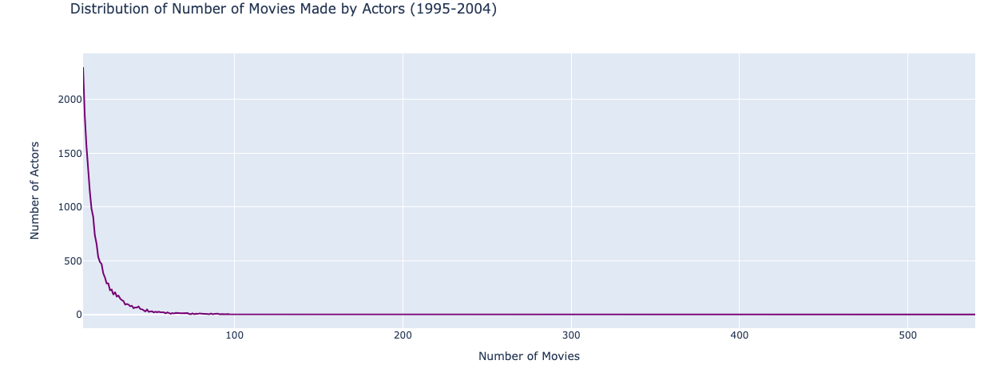

It is evident from both the graph and the table that the majority of actors were cast in 10 movies, with a sharp decline in the number of movies as the number of castings increases beyond that.

In [66]:
# Counting the number of genres the actors participated in 
nodes['no_of_genres'] = nodes['genres'].str.count(',') + 1


<a id='7.2'></a>
<h1 align="left"><font size="4" color='#1A846B'>  7.2. Number of Genres of the actors </font></h1>

The  result below shows the number of actors in the dataset grouped by the number of genres they appeared in. For example, there are 3107 actors who appeared in 6 genres, 2691 actors who appeared in 7 genres, and so on. The result is sorted in ascending order based on the count of actors in the respective genre, so it shows that there are more actors who appeared in a smaller number of genres, with a gradual decrease as the number of genres increases.

In [67]:
genre_counts = nodes[['no_of_genres']].value_counts().sort_values(ascending=False)
print(genre_counts)


no_of_genres
6               3107
7               2691
5               2564
8               2056
4               1657
9               1401
3                970
2                916
10               831
11               518
12               342
13               222
14               114
1                 94
15                48
16                33
17                 9
18                 3
19                 1
dtype: int64


In [69]:
import plotly.express as px

# Compute the genre counts
genre_counts = nodes['no_of_genres'].value_counts().sort_index()

# Create a dataframe for the counts
df = pd.DataFrame({'no_of_genres': genre_counts.index, 'count': genre_counts.values})

# Create the line plot
fig = px.line(df, x='no_of_genres', y='count', title='Genre Counts')
#fig.update_layout(xaxis_title='Number of Genres', yaxis_title='Count')

# Show the plot
#fig.show()


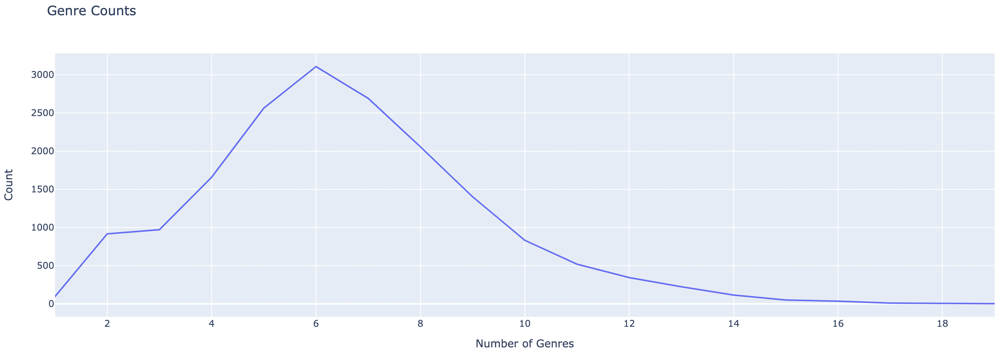

Based on the output of the code, we can see that the majority of actors in the dataset have between 5 and 8 genres, with the most common number of genres being 6 (with 3107 actors having 6 genres). This suggests that most actors have a relatively diverse set of genres they have worked in.

On the other end of the spectrum, there are only a few actors with 17, 18, or 19 genres, suggesting that it is relatively rare for an actor to have worked in such a diverse range of genres.

In [52]:
# convert 'movies_95_04' column to integer data type
df_with_genres['movies_95_04'] = df_with_genres['movies_95_04'].astype(int)

# get distribution of number of movies by actor
movies_by_actor = df_with_genres.groupby('ActorName')['movies_95_04'].sum()

# get distribution of number of genres by actor
# convert 'main_genre' column to string data type
df_with_genres['main_genre'] = df_with_genres['main_genre'].astype(str)
genres_by_actor = df_with_genres.groupby('ActorName')['main_genre'].nunique()

In [71]:
import plotly.express as px

genre_counts = df_with_genres['main_genre'].value_counts().sort_values(ascending=False)
sorted_genres = genre_counts.index.tolist()

sorted_df = df_with_genres.sort_values(by=['main_genre'], key=lambda x: x.map(sorted_genres.index))

fig = px.histogram(sorted_df, x='main_genre', nbins=len(df_with_genres['main_genre'].unique()), color='main_genre',
                   color_discrete_sequence=px.colors.qualitative.Pastel1)
#fig.update_layout(title='Distribution of Actors in Main Genre',xaxis_title='Main Genre',yaxis_title='Number of Actors')
#fig.show()


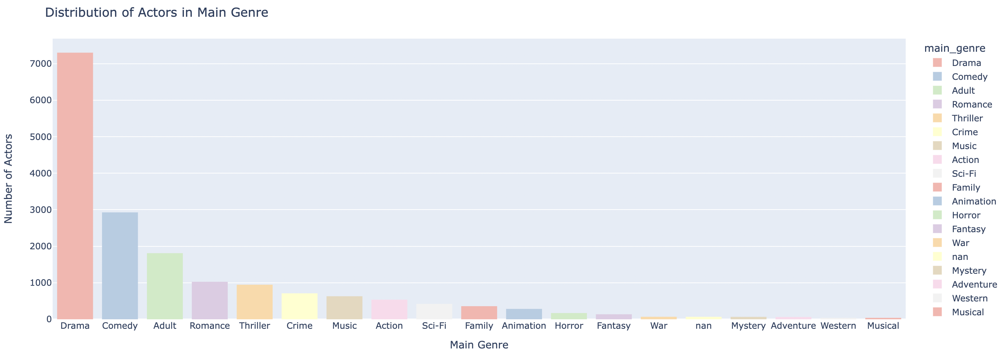

Use the columns of the genres to Create a distribution of the different genres. 

In [54]:
cols_to_convert = df_with_genres.columns.drop(['id', 'ActorName','main_genre'])
df_with_genres[cols_to_convert] = df_with_genres[cols_to_convert].apply(pd.to_numeric, errors='coerce')


In [72]:
# create subplots
fig = sp.make_subplots(rows=9, cols=4, subplot_titles=df_with_genres.columns[3:])

# loop over columns and add histogram
for i, col in enumerate(df_with_genres.columns[3:]):
    row_num = (i // 4) + 1
    col_num = (i % 4) + 1
    fig.add_trace(go.Histogram(x=df_with_genres[col], name=col), row=row_num, col=col_num)

# update layout
#fig.update_layout(height=2000, width=1000, title='Distribution of Genres in Movies')

# show plot
#fig.show()

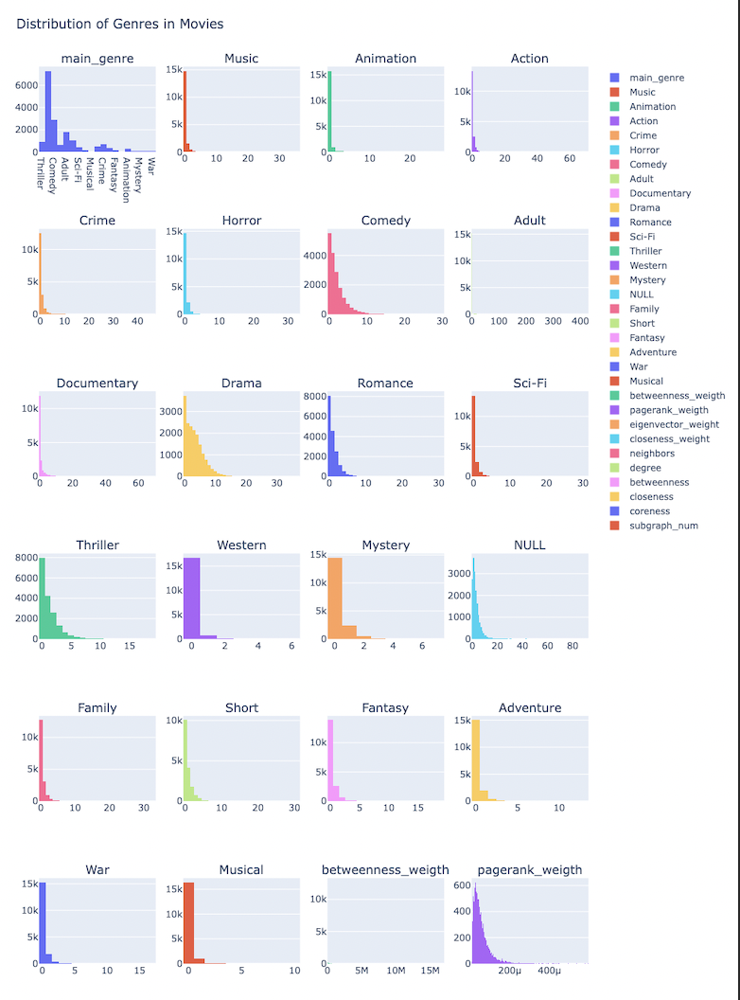

In [73]:
import plotly.graph_objects as go

# create a new dataframe with only the columns of interest
df_genres_count = df_with_genres.iloc[:, 4:25].sum()

# sort genres by count
df_genres_count = df_genres_count.sort_values(ascending=False)

# set custom color palette
colors = ['#00adb5', '#393e46', '#222831', '#eeeeee', '#ffd369', '#f8b500', '#f6416c', '#ff7b25', '#1a1a2e', '#3282b8','#CE99DE','#9f15f3','#390825','#352331','#bc366e','#314b7e','#823814','#4a4788','#2b303b','#3a9b9e']

# create a bar chart for the counts of each genre
fig = go.Figure(go.Bar(x=df_genres_count.index, y=df_genres_count.values, marker_color=colors))
#fig.update_layout(title='Number of Movies per Genre Count from all actors', xaxis_title='Genre', yaxis_title='Count')
#fig.show()


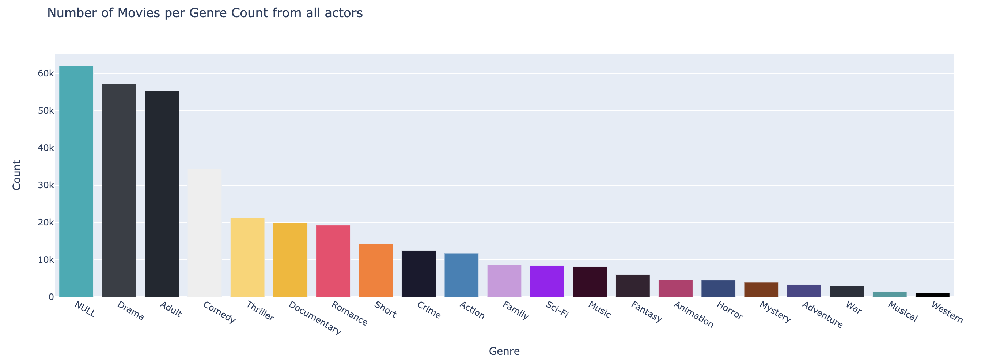

**NULL:** It's possible that this category represents movies that do not have a specific genre or that the genre information is missing or incomplete. It's also possible that this category includes movies from various genres that are not categorized correctly.

**Drama:**This is a broad category that can include many different types of movies that focus on serious or emotional themes. Drama movies often have strong character development and can appeal to a wide audience. It's possible that the high number of drama movies reflects the popularity of this genre among filmmakers and audiences.

**Adult:** This category likely includes movies that are intended for mature audiences and may contain explicit content. It's possible that these movies are very short movies and have more movies available.

**Comedy:** This is a popular genre. Comedy movies can appeal to a wide audience and may be more likely to generate high box office revenues than other genres. It's possible that the high number of comedy movies reflects the popularity of this genre among filmmakers and audiences.

It's important to note that the number of movies in a particular genre does not necessarily reflect the quality or popularity of those movies.

<a id='8'></a>
<h1 align="left"><font size="4" color='#1A846B'>  8) Degree, betweeness and closeness </font></h1>

Obtain three vectors with the degree, betweeness and closeness for each vertex of the actors' graph.

In [ ]:
df_with_genres.head(3)


,id,ActorName,movies_95_04,main_genre,Mystery,Adult,Fantasy,Action,Family,Romance,Comedy,Music,Crime,Horror,Animation,Thriller,Musical,NULL,Drama,Western,Adventure,Short,Documentary,War,Sci-Fi,betweenness_weigth,pagerank_weigth,eigenvector_weight,closeness_weight,neighbors,degree,betweenness,closeness,subgraph_num
0,n15629,"Rudder, Michael (I)",12,Thriller,0,0,1,1,0,1,1,0,0,1,0,2,0,2,1,0,0,0,0,1,1,551.325397,0.000057,0.000283,0.658297,"[431, 672, 717, 823, 858, 911, 1787, 3674, 391...",36,3929.012117,0.110066,0
1,n5026,"Morgan, Debbi",16,Drama,0,0,0,0,0,2,2,0,0,2,0,0,0,3,6,0,0,0,1,0,0,949.411508,0.000056,0.000261,0.667708,"[352, 452, 1638, 2110, 2170, 3419, 4879, 5250,...",23,21716.283252,0.122167,0
2,n11252,"Bellows, Gil",33,Drama,2,0,1,0,1,6,6,0,0,1,0,4,0,2,7,0,0,2,1,0,0,19206.960317,0.000058,0.000055,0.689974,"[3188, 4430, 4452, 4671, 5324, 5379, 5902, 652...",22,13283.000044,0.112943,0


Obtain the list of the 20 actors with the largest degree centrality. It can be useful to show a list with the degree, the name of the actor, the number of movies, the main genre, and the number of genres in which the actor has participated.

<a id='8.1'></a>
<h1 align="left"><font size="4" color='#1A846B'>  <b> 8.1) Actor with the highest Degree </b><br> </font></h1>

Note the following analyzes focus on all nodes and edges and do not differentiate between subgraphs. The same analyis could be done by each subgraph. 

**8) Who is the actor with highest degree centrality?**

In [ ]:
df_with_genres.sort_values(by='degree', ascending=False).head(1)

,id,ActorName,movies_95_04,main_genre,Mystery,Adult,Fantasy,Action,Family,Romance,Comedy,Music,Crime,Horror,Animation,Thriller,Musical,NULL,Drama,Western,Adventure,Short,Documentary,War,Sci-Fi,betweenness_weigth,pagerank_weigth,eigenvector_weight,closeness_weight,neighbors,degree,betweenness,closeness,subgraph_num
12147,n162,"Davis, Mark (V)",540,Adult,0,429,1,1,0,0,3,0,1,0,0,0,0,92,6,0,0,1,5,0,1,1.703766e+07,0.000427,0.980388,0.835476,"[83, 86, 104, 131, 137, 139, 142, 181, 184, 29...",784,184760.341185,0.104901,0



**Davis Mark** as seen in the below table, is an American actor who is known for his work in adult films. He has been active in the adult film industry since the 1980s and has appeared in a large number of adult films. He has played in 10 different genres, including Adult, which is the main genre he is associated with.

The degree of the David Mark node represents the number of other actors they have worked with. In the co-starring graph of the movies dataset, Davis Mark has the highest degree among all actors in the Adult genre. This means that he has worked with a large number of other actors in this genre, which may suggest that he is a prolific and well-connected actor within the adult film industry.

It's important to note that the degree centrality measure only takes into account the number of connections a node has, without considering the importance or influence of the other nodes it is connected to. Therefore, while Davis Mark has the highest degree in the Adult genre, there may be other actors who have more important or influential connections within the industry.

In [74]:
# Get the neighbors of n162
neighbors = g.neighbors('n162')

# Create a subgraph with n2108 and its neighbors
subgraph_Mark = g.subgraph(['n162'] + neighbors)

# Set the ActorName as the vertex label for node 'n162'
#subgraph_Mark.vs.find('n162')['label'] = nodes.loc[nodes['id'] == 'n162', 'ActorName'].values[0]

# Plot the subgraph without vertex labels
visual_style = {}
visual_style["vertex_size"] = 20
visual_style["bbox"] = (800, 800)
visual_style["margin"] = 100
#visual_style["vertex_label"] = ''
#ig.plot(subgraph_Mark, **visual_style)


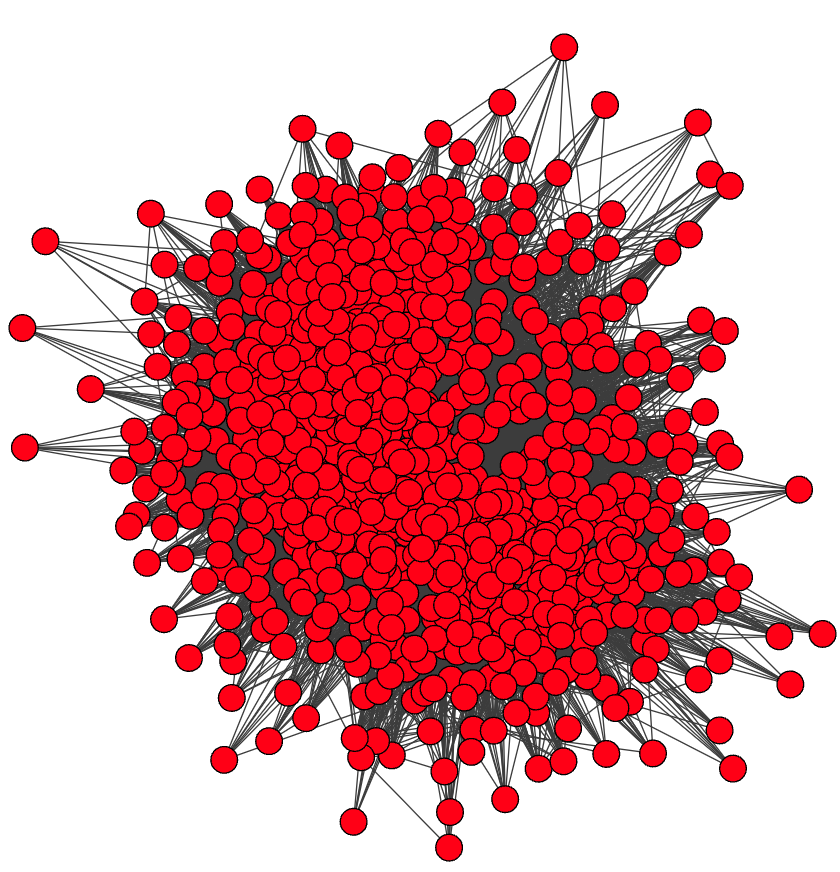

<a id='8.2'></a>
<h1 align="left"><font size="4" color='#1A846B'>  <b> Degree </b><br> </font></h1>

**8.2) How do you explain the high degree of the top-20 list??**

In [ ]:


# Get the degree centrality of each actor
degree = g.degree()

# Create a dataframe with the actor ids and their degree centrality
#degree_df = pd.DataFrame({'id': g.vs['name'], 'Degree': degree})

# Merge the degree dataframe with the nodes dataframe to get additional information
merged_df = pd.merge(pd.DataFrame({'id': g.vs['name'], 'Degree': g.degree()}), nodes, on='id')

# Split the genres column into number of genres and add as a new column
merged_df['no_of_genres'] = merged_df['genres'].str.count(',') + 1

# Sort the merged dataframe by degree centrality in descending order and get the top 20 actors
top_actors = merged_df.sort_values('Degree', ascending=False).head(20).reset_index(drop=True)

# Add a ranking column
top_actors['Rank'] = top_actors.index + 1

# Reorder the columns
top_actors = top_actors[['Rank', 'Degree', 'ActorName', 'movies_95_04', 'main_genre', 'no_of_genres']]

# Print the top actors with their degree, name, number of movies, main genre, and number of genres participated in
print(top_actors)

    Rank  Degree            ActorName  movies_95_04 main_genre  no_of_genres
0      1     784      Davis, Mark (V)           540      Adult            10
1      2     610    Sanders, Alex (I)           467      Adult            10
2      3     599     North, Peter (I)           460      Adult             8
3      4     584          Marcus, Mr.           435      Adult             6
4      5     561       Tedeschi, Tony           364      Adult            11
5      6     555           Dough, Jon           300      Adult             8
6      7     545      Stone, Lee (II)           403      Adult             7
7      8     533        Voyeur, Vince           370      Adult            10
8      9     500  Lawrence, Joel (II)           315      Adult             7
9     10     493    Steele, Lexington           429      Adult             8
10    11     490          Ashley, Jay           309      Adult             8
11    12     475            Boy, T.T.           336      Adult             8

High degree centrality in actors means that they have appeared in a large number of movies or have been involved in a large number of collaborations with other actors. This can indicate their popularity, influence, and potentially their expertise or skill in acting. It may also suggest that they have a wide range of connections within the movie industry, which can be beneficial for their career advancement. However, it's important to note that high degree centrality alone does not necessarily guarantee success or talent, and other factors such as acting ability, personal and professional relationships, and opportunities also play a role in an actor's career.

The actors with the highest degree centrality are mainly from the adult film industry. Degree centrality measures the number of connections (edges) each node (actor) has in a network (movies), so a high degree centrality suggests that these actors have appeared in a large number of movies and/or have worked with a large number of other actors and are normally very short movies, so there are more movies done than in other genres.

In the case of the adult film industry, it is likely that these actors have a high degree centrality because they have appeared in many movies with different partners. In addition, the adult film industry may have a higher turnover rate than other industries, leading to a larger pool of actors and more frequent collaborations between actors.

It is worth noting that degree centrality alone may not be a comprehensive measure of an actor's success or influence in the movie industry, as there are other factors such as critical acclaim, box office success, and industry connections that can also contribute to an actor's overall impact.

<a id='8.3'></a>
<h1 align="left"><font size="4" color='#1A846B'>  <b> 8.3Highest Betweeness </b><br> </font></h1>

Obtain the list of the 20 actors with the largest betweenness centrality. Show a list with the betweenness, the name of the actor, the number of movies, the main genre, and the number of genres in which the actor has participated.

**8.3) Who is the actor with highest betweenes?**

**Betweenness centrality** is a measure of the importance of a node (actor) in a network. It is based on the number of shortest paths between pairs of nodes that pass through that node. In other words, a node with high betweenness centrality is one that lies on many of the shortest paths between other nodes in the network.

In [ ]:
df_with_genres.sort_values(by='betweenness', ascending=False).head(1)


,id,ActorName,movies_95_04,main_genre,Mystery,Adult,Fantasy,Action,Family,Romance,Comedy,Music,Crime,Horror,Animation,Thriller,Musical,NULL,Drama,Western,Adventure,Short,Documentary,War,Sci-Fi,betweenness_weigth,pagerank_weigth,eigenvector_weight,closeness_weight,neighbors,degree,betweenness,closeness
10548,n2108,"Jeremy, Ron",280,Adult,0,149,0,0,0,3,15,2,0,9,1,3,1,43,15,0,1,4,26,0,8,1.487206e+07,0.000465,0.752032,0.836407,"[83, 104, 131, 183, 199, 216, 301, 345, 365, 4...",471,9.748544e+06,0.28272


**Ron Jeremy** is a former adult film actor and director who has been active in the industry for over three decades. He has appeared in over 2,000 adult films and is known as one of the most recognizable figures in the industry. The fact that he has worked with 471 other actors and has the highest betweenness centrality suggests that he has played a significant role in connecting different parts of the network. In other words, he is a central figure who has helped to bridge different groups of actors, which has led to him having a high level of influence in the network. This actor seems to be well-connected with other actors in the network, and is frequently on the shortest path between other pairs of actors. This could be due to his longevity in the industry and his ability to form connections with a wide variety of other actors. It is also possible that his high betweenness centrality is due to factors such as his reputation, level of fame, and ability to bring together people from different parts of the industry. Overall, the high betweenness centrality of Ron Jeremy suggests that he has had a significant impact on the adult film industry and has played a key role in connecting different parts of the network, which can be seen in the graph below. 





In [75]:
# Get the neighbors of n2108
neighbors = g.neighbors('n2108')

# Create a subgraph with n2108 and its neighbors
subgraph_Ron = g.subgraph(['n2108'] + neighbors)

# Set the ActorName as the vertex label for node 'n2108'
subgraph_Ron.vs.find('n2108')['label'] = nodes.loc[nodes['id'] == 'n2108', 'ActorName'].values[0]

# Plot the subgraph with only the label for node 'n2108'
visual_style = {}
visual_style["vertex_size"] = 20
visual_style["bbox"] = (800, 800)
visual_style["margin"] = 100
visual_style["vertex_label"] = [v['ActorName'] if v.index == subgraph_Ron.vs.find('n2108').index else '' for v in subgraph_Ron.vs]
#ig.plot(subgraph_Ron, **visual_style)


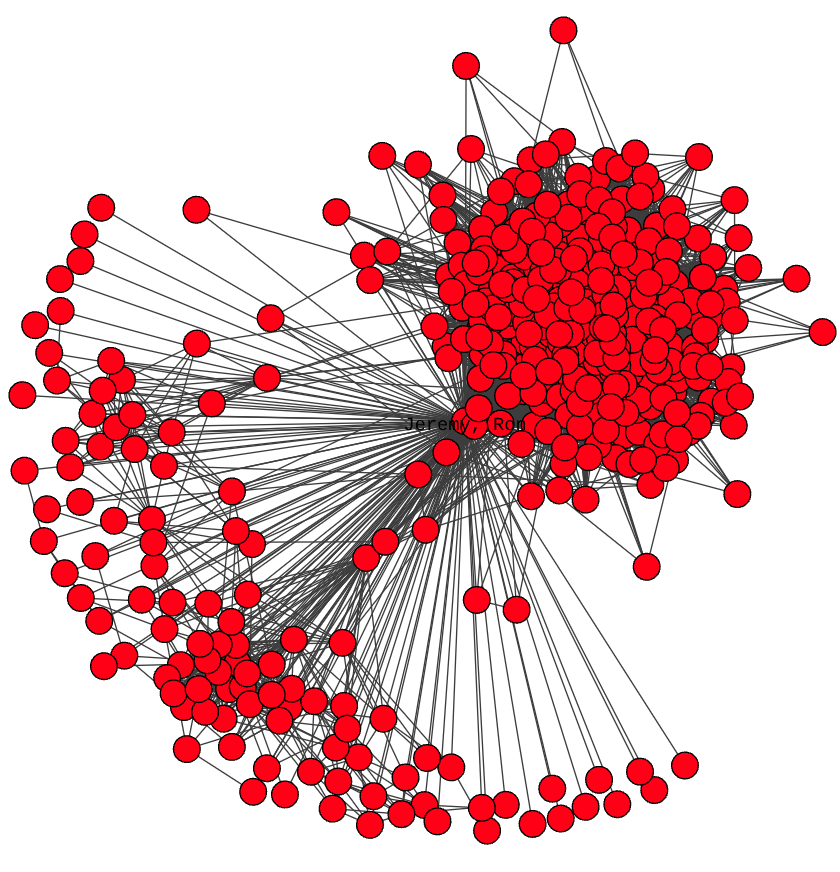

In [ ]:
# Get the neighbors of n2108
neighbors = g.neighbors('n2108')

# Count the number of neighbors
num_neighbors = len(neighbors)

# Print the result
print(f"The number of neighbors of n2108 is {num_neighbors}")

The number of neighbors of n2108 is 471


<a id='8.4'></a>
**8.4) How do you explain the high betweenness of the top-20 list?**

In [ ]:
#weights adding 
# Get the betweenness centrality of each actor
betweenness = g.betweenness(directed=False)

# Create a dataframe with the actor ids and their betweenness centrality
betweenness_df = pd.DataFrame({'id': g.vs['name'], 'Betweenness': betweenness})

# Merge the betweenness dataframe with the nodes dataframe to get additional information
merged_df = pd.merge(betweenness_df, nodes, on='id')

# Split the genres column into number of genres and add as a new column
merged_df['no_of_genres'] = merged_df['genres'].str.count(',') + 1

# Sort the merged dataframe by betweenness centrality in descending order and get the top 20 actors
top_actors = merged_df.sort_values('Betweenness', ascending=False).head(20).reset_index(drop=True)

# Add a ranking column
top_actors['Rank'] = top_actors.index + 1

# Reorder the columns
top_actors = top_actors[['Rank', 'Betweenness', 'ActorName', 'movies_95_04', 'main_genre', 'no_of_genres']]

# Print the top actors with their betweenness, name, number of movies, main genre, and number of genres participated in
print(top_actors)


    Rank   Betweenness             ActorName  movies_95_04 main_genre  \
0      1  9.748544e+06           Jeremy, Ron           280      Adult   
1      2  4.716909e+06      Chan, Jackie (I)            59     Comedy   
2      3  4.330663e+06        Cruz, Penélope            46      Drama   
3      4  4.295503e+06      Shahlavi, Darren            16     Action   
4      5  4.267099e+06  Del Rosario, Monsour            20     Action   
5      6  4.037356e+06     Depardieu, Gérard            56     Comedy   
6      7  2.570247e+06     Bachchan, Amitabh            35    Romance   
7      8  2.539614e+06    Jackson, Samuel L.            97      Drama   
8      9  2.368164e+06     Soualem, Zinedine            65     Comedy   
9     10  2.316388e+06       Del Rio, Olivia            84      Adult   
10    11  2.136980e+06      Jaenicke, Hannes            66   Thriller   
11    12  2.117390e+06          Hayek, Salma            44      Drama   
12    13  2.098485e+06                  Pelé       

The high betweenness of the top-20 list suggests that these actors are likely to play important roles in connecting different parts of the movie industry network. Actors with high betweenness centrality act as bridges between different groups of actors and movies, and they play a crucial role in the flow of information, resources, and opportunities across the network. As examples, 
Chackie Chan and Penelope Cruz have also worked with a diverse range of actors and have appeared in many films, leading to their high betweenness centrality scores.
On the other hand, Darren Shahlavi was a British actor who primarily worked in action movies. He participated in only 16 movies between 1995 and 2004, but he has a high betweenness centrality because he acted as a bridge between different clusters in the movie network. Many of the movies he acted in were martial arts or action movies, and he worked with many different actors and directors in this genre.

In other words, these actors have the potential to control the flow of information and resources, as they are positioned in the network to serve as intermediaries between otherwise disconnected groups. This makes them valuable assets in the industry, as they can facilitate collaboration, innovation, and success. It is also possible that some of the actors on the list have achieved high betweenness centrality due to their involvement in particular genres or types of movies that are well-connected within the network, making them important figures in those areas.

We also see actors from a variety of genres including Adult, Comedy, Drama, and Thriller, indicating that high betweenness centrality is not limited to actors in any one particular genre and shows the importance of these actors in a field.

<a id='9'></a>
<h1 align="left"><font size="4" color='#1A846B'>  <b> Inverted Degree </b><br> </font></h1>

Inverting the weights for betweenness centrality allows nodes with lower weighted shortest paths to be ranked higher, which can be important in networks where shorter distances are more desirable. It can also lead to a more equitable distribution of centrality scores among nodes.

In [ ]:
df_with_genres.sort_values(by='betweenness_weigth', ascending=False).head(1)

,id,ActorName,movies_95_04,main_genre,Mystery,Adult,Fantasy,Action,Family,Romance,Comedy,Music,Crime,Horror,Animation,Thriller,Musical,NULL,Drama,Western,Adventure,Short,Documentary,War,Sci-Fi,betweenness_weigth,pagerank_weigth,eigenvector_weight,closeness_weight,neighbors,degree,betweenness,closeness
12147,n162,"Davis, Mark (V)",540,Adult,0,429,1,1,0,0,3,0,1,0,0,0,0,92,6,0,0,1,5,0,1,1.703766e+07,0.000427,0.980388,0.835476,"[83, 86, 104, 131, 137, 139, 142, 181, 184, 29...",784,931853.137495,0.2493


In [ ]:
# Get the betweenness centrality of each actor
betweenness = g_inv.betweenness(weights='weight', directed=False)

# Create a dataframe with the actor ids and their betweenness centrality
betweenness_weight = pd.DataFrame({'id': g_inv.vs['name'], 'Betweenness_w': betweenness})

# Merge the betweenness dataframe with the nodes dataframe to get additional information
merged_df = pd.merge(betweenness_weight, nodes, on='id')

# Split the genres column into number of genres and add as a new column
merged_df['no_of_genres'] = merged_df['genres'].str.count(',') + 1

# Sort the merged dataframe by betweenness centrality in descending order and get the top 20 actors
top_actors = merged_df.sort_values('Betweenness_w', ascending=False).head(20).reset_index(drop=True)

# Add a ranking column
top_actors['Rank'] = top_actors.index + 1

# Reorder the columns
top_actors = top_actors[['Rank', 'Betweenness_w', 'ActorName', 'movies_95_04', 'main_genre', 'no_of_genres']]

# Print the top actors with their betweenness, name, number of movies, main genre, and number of genres participated in
print(top_actors)


    Rank  Betweenness_w                  ActorName  movies_95_04 main_genre  \
0      1   1.703766e+07            Davis, Mark (V)           540      Adult   
1      2   1.487206e+07                Jeremy, Ron           280      Adult   
2      3   9.651273e+06              Holmes, Steve           288      Adult   
3      4   9.200956e+06             Cruz, Penélope            46      Drama   
4      5   8.789476e+06          Perry, David (VI)           262      Adult   
5      6   7.823371e+06           Blum, Steven (I)           121     Sci-Fi   
6      7   7.444954e+06                Cruise, Tom            46      Music   
7      8   6.827682e+06           Goldberg, Whoopi           109     Comedy   
8      9   6.052977e+06          Depardieu, Gérard            56     Comedy   
9     10   6.015747e+06              Norris, Daran            79     Sci-Fi   
10    11   5.973748e+06              Welker, Frank           159     Family   
11    12   5.217806e+06           Chan, Jackie (I)  

The result of the weighted betweenness analysis suggests that the actors with the highest betweenness centrality are different from the ones with the highest unweighted betweenness. In particular, the weighted analysis takes into account not only the number of shortest paths that pass through an actor but also the weights of the edges. In this case, the weights represent the number of movies that the actors have participated in.

Interestingly, the actor with the highest **weighted betweenness is Mark Davis**, who has participated in 540 movies in the adult genre and also has the highest degree centrality. This indicates that he is a **central actor** in the network of actors in the adult movie industry.

Other actors with **high weighted betweenness** are also from the adult movie industry, such as **Ron Jeremy, Steve Holmes, and David Perry**. This suggests that these actors have worked with many other actors in the industry, possibly due to the nature of the adult movie genre where actors may have to work with different partners in different movies.

However, there are also actors from other genres with high weighted betweenness, such as **Penélope Cruz, Whoopi Goldberg, Gérard Depardieu, and Samuel L. Jackson**. This suggests that these actors have participated in many movies and worked with many other actors, making them important bridges between different parts of the network.

Overall, the result of the weighted betweenness analysis provides a more nuanced understanding of the centrality of actors in the network, taking into account the weights of the edges and revealing the importance of actors in the adult movie industry as well as bridges between different actors/genres.

<a id='8.5'></a>
<h1 align="left"><font size="4" color='#1A846B'>  <b> Closeness </b><br> </font></h1>

Obtain the list of the 20 actors with the largest closeness centrality. Show a list with the closeness the name of the actor, the number of movies, the main genre, and the number of genres in which the actor has participated.

**8.5 Who is the actor with highest closeness centrality?**

In [ ]:
df_with_genres.sort_values(by='closeness', ascending=False).head(1)

,id,ActorName,movies_95_04,main_genre,Mystery,Adult,Fantasy,Action,Family,Romance,Comedy,Music,Crime,Horror,Animation,Thriller,Musical,NULL,Drama,Western,Adventure,Short,Documentary,War,Sci-Fi,betweenness_weigth,pagerank_weigth,eigenvector_weight,closeness_weight,neighbors,degree,betweenness,closeness
16050,n17737,"Zhou, Xun",10,Drama,1,0,0,0,0,3,1,0,0,0,0,0,0,1,4,0,0,0,0,0,0,0.0,0.000057,0.0,2.0,[12747],1,0.0,1.0


In [76]:
# Get the neighbors 
neighbors = g.neighbors('n17737')

# Create a subgraph with n17737 and its neighbors
subgraph_Xun = g.subgraph(['n17737'] + neighbors)

# Set the ActorName as the vertex label for node 'n17737'
subgraph_Xun.vs.find('n17737')['label'] = nodes.loc[nodes['id'] == 'n17737', 'ActorName'].values[0]

# Plot the subgraph with only the label for node 'n17737'
visual_style = {}
visual_style["vertex_size"] = 20
visual_style["bbox"] = (300, 300)
visual_style["margin"] = 100
visual_style["vertex_label"] = [v['ActorName'] if v.index == subgraph_Xun.vs.find('n17737').index else '' for v in subgraph_Xun.vs]
#ig.plot(subgraph_Xun, **visual_style)

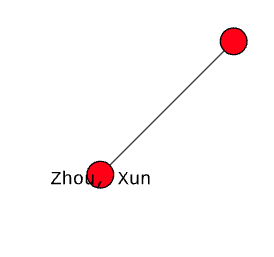

Closeness is a measure of how easily a node can access other nodes in a network. In a network where there are multiple nodes with the same closeness, selecting only one of them as the "top" node would not be appropriate, as it would not fully capture the overall network structure. In this case, all the nodes in the top 29 have the same closeness degree, indicating that they are all equally central in the network. Therefore, it would be more appropriate to consider all of them as the top nodes rather than just one.

Furthermore, selecting only one node as the top node in a network can be misleading, as it may not fully represent the overall network structure. It is important to consider all nodes with high closeness in order to obtain a more complete picture of the network.

In [ ]:
# Filter by subgraph_num = 0
filtered_df = df_with_genres[df_with_genres['subgraph_num'] == 0]

# Sort by closeness in descending order
sorted_df = filtered_df.sort_values(by='closeness', ascending=False)

# Print the top row of the sorted dataframe

top_actors = sorted_df[['closeness', 'id','ActorName', 'movies_95_04', 'main_genre', 'neighbors']]

top_actors.head(1)

,closeness,id,ActorName,movies_95_04,main_genre,neighbors
10412,0.309265,n1529,"Jackson, Samuel L.",97,Drama,"[1, 8, 48, 67, 80, 100, 116, 161, 168, 177, 25..."


For this measure it could be beneficial to look at Subgraph 1 sinec it represent 99% of all edges and nodes: 
The result suggests that among all the actors present in subgraph 1, Samuel L. Jackson has the highest closeness centrality, which means he has the shortest path to connect to all other actors in the same subgraph. This indicates that he has worked with many actors within subgraph 1, and therefore, he could be considered as a central and influential actor in this particular subgraph. It is also interesting to note that he has been involved in a large number of movies (97) in the time period between 1995 and 2004, which indicates his prolific acting career during that period.

In [ ]:
# Filter the dataframe by subgraph_num = 0
subgraph_df = df_with_genres[df_with_genres['subgraph_num'] == 0]

# Sort the filtered dataframe by closeness in descending order and get the top actor
top_actor = subgraph_df.sort_values(by='closeness', ascending=False).head(1)

# Print the top actor with their Closeness, name, number of movies, main genre, and number of genres participated in
print("Top actor in subgraph 0:\n", top_actor[['closeness', 'ActorName', 'movies_95_04', 'main_genre', 'no_of_genres']])


In [77]:
# Get the neighbors 
neighbors = g.neighbors('n1529')

# Create a subgraph with n1529 and its neighbors
subgraph_Xun = g.subgraph(['n1529'] + neighbors)

# Set the ActorName as the vertex label for node 'n1529'
subgraph_Xun.vs.find('n1529')['label'] = nodes.loc[nodes['id'] == 'n1529', 'ActorName'].values[0]

# Plot the subgraph with only the label for node 'n1529'
visual_style = {}
visual_style["vertex_size"] = 20
visual_style["bbox"] = (300, 300)
visual_style["margin"] = 100
visual_style["vertex_label"] = [v['ActorName'] if v.index == subgraph_Xun.vs.find('n1529').index else '' for v in subgraph_Xun.vs]
#ig.plot(subgraph_Xun, **visual_style)

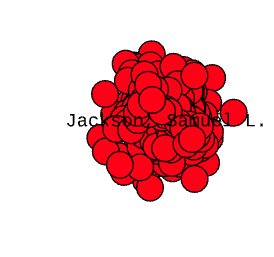

<a id='8.6'></a>
**8.6 How do you explain the high closeness of the top-20 list?**

If we consider all subgraphs equally. 

In [ ]:
# Get the closeness centrality of each actor
closeness = g.closeness(vertices= g.vs,normalized= True, mode= "all")

# Create a dataframe with the actor ids and their closeness centrality
closseness_df = pd.DataFrame({'id': g.vs['name'], 'Closeness': closeness})

# Merge the closeness dataframe with the nodes dataframe to get additional information
merged_df = pd.merge(closseness_df, nodes, on='id')

# Split the genres column into number of genres and add as a new column
merged_df['no_of_genres'] = merged_df['genres'].str.count(',') + 1

# Sort the merged dataframe by closseness centrality in descending order and get the top 20 actors
top_actors = merged_df.sort_values('Closeness', ascending=False).head(29).reset_index(drop=True)

# Add a ranking column
top_actors['Rank'] = top_actors.index + 1

# Reorder the columns
top_actors = top_actors[['Rank', 'Closeness', 'ActorName', 'movies_95_04', 'main_genre', 'no_of_genres']]

# Print the top actors with their Closeness, name, number of movies, main genre, and number of genres participated in
print(top_actors)


    Rank  Closeness          ActorName  movies_95_04 main_genre  no_of_genres
0      1        1.0          Zhou, Xun            10      Drama             5
1      2        1.0   Servais, Manuela            11      Drama             4
2      3        1.0   Shakibai, Khosro            12      Drama             3
3      4        1.0   Kuusniemi, Matti            10     Horror             6
4      5        1.0     Nawrocki, Mike            20     Family             4
5      6        1.0  Holt, David (III)            13     Comedy             6
6      7        1.0    Chamish, Leanna            11     Horror             7
7      8        1.0      Lawson, Denis            13      Drama             8
8      9        1.0      Vischer, Lisa            16     Family             4
9     10        1.0  Walsh, Darren (I)            18     Comedy             4
10    11        1.0         Wood, T.J.            14      Adult             2
11    12        1.0       Wang, Zhiwen            10      Drama 

The actors listed in the DataFrame have a closeness score of 1.0, which means they are the most central nodes in their respective subgraphs. However, it's important to note that most of these subgraphs have only two nodes, which indicates that these actors have acted in movies with only one other actor in the dataset.

It's difficult to draw any conclusions about the actors' backgrounds based solely on this information. However, we can note that there are actors from a variety of genres represented in the list, including drama, horror, comedy, family, romance, sci-fi, and thriller. Some of the actors are relatively unknown, while others, such as Emilia Fox, have had successful acting careers.

It's possible that the isolation of these actors is due to a number of factors, such as the regional or cultural focus of the movies they've acted in, or the fact that they may be more likely to act in independent or art house films with smaller casts. For that reason using the closeness for subgraph 1 is more appropiate to get an actor with many close relationships. 

<a id='9'></a>
<h1 align="left"><font size="4" color='#1A846B'>  Closeness: Subgraph 1 </b><br> </font></h1>

In [ ]:
# Find the largest connected component
largest_component = g.clusters().giant()

# Get the closeness centrality of each actor in the largest connected component
closeness = largest_component.closeness(vertices=largest_component.vs, normalized=True)

# Create a dataframe with the actor ids and their closeness centrality
closeness_df = pd.DataFrame({'id': largest_component.vs['name'], 'Closeness': closeness})

# Merge the closeness dataframe with the nodes dataframe to get additional information
merged_df = pd.merge(closeness_df, nodes, on='id')

# Split the genres column into number of genres and add as a new column
merged_df['no_of_genres'] = merged_df['genres'].str.count(',') + 1

# Sort the merged dataframe by closeness centrality in descending order and get the top 20 actors
top_actors = merged_df.sort_values('Closeness', ascending=False).head(20).reset_index(drop=True)

# Add a ranking column
top_actors['Rank'] = top_actors.index + 1

# Reorder the columns
top_actors = top_actors[['Rank', 'Closeness', 'ActorName', 'movies_95_04', 'main_genre', 'no_of_genres']]

# Print the top actors with their Closeness, name, number of movies, main genre, and number of genres participated in
print(top_actors)


<ipython-input-56-c31a5f752cce>:2: DeprecationWarning:

Graph.clusters() is deprecated; use Graph.connected_components() instead



    Rank  Closeness               ActorName  movies_95_04 main_genre  \
0      1   0.309265      Jackson, Samuel L.            97      Drama   
1      2   0.307760        Goldberg, Whoopi           109     Comedy   
2      3   0.305905            Berry, Halle            63     Family   
3      4   0.305669           Diaz, Cameron            59      Drama   
4      5   0.305231              Hanks, Tom            75     Family   
5      6   0.304719            Stiller, Ben            66     Comedy   
6      7   0.302611         Myers, Mike (I)            58     Comedy   
7      8   0.302606    Douglas, Michael (I)            41     Family   
8      9   0.301217     Lopez, Jennifer (I)            68      Music   
9     10   0.300708         De Niro, Robert            51     Comedy   
10    11   0.300485       Willis, Bruce (I)            52   Thriller   
11    12   0.300408             Cruise, Tom            46      Music   
12    13   0.299336          Hopper, Dennis           106      M

**Subgraph 1**
From the result, we can see that the top 5 actors with the highest closeness centrality are Jackson, Samuel L., Goldberg, Whoopi, Berry, Halle, Diaz, Cameron, and Hanks, Tom. This suggests that these actors are important in connecting other actors in the subgraph and are likely to have acted in many movies together with other actors in the subgraph.

For example, Samuel L. Jackson has a closeness of 0.309, which means he is only a few steps away from most other actors in the network. Jackson has appeared in many movies with other actors on this list, such as Bruce Willis, Whoopi Goldberg, and Robert De Niro, who themselves have also worked with many other actors in the network.

Furthermore, we can see that the main genres of the top actors with high closeness centrality are mostly in Drama, Comedy, Family, and Thriller. This indicates that these genres may be popular within the subgraph and that these actors may have played significant roles in movies of these genres.

Lastly, we can also see that the number of genres for each actor varies from 16 to 10. This suggests that the actors with higher numbers of genres have acted in movies of diverse genres, which may have contributed to their high closeness centrality.

<a id='9'></a>
<h1 align="left"><font size="4" color='#1A846B'>  Weighted closeness Subgraph 1</b><br> </font></h1>

Weighted closeness can be more appropriate than unweighted closeness in certain scenarios. For example, if we are modeling a social network where some connections are stronger (e.g. close friendships) than others (e.g. casual acquaintances), weighted closeness can give us a better sense of who is most central in the network

In [ ]:
# Filter the dataframe by subgraph_num = 0
subgraph_df = df_with_genres[df_with_genres['subgraph_num'] == 0]

# Sort the filtered dataframe by closeness in descending order and get the top actor
top_actor = subgraph_df.sort_values(by='closeness_weight', ascending=False).head(1)

# Print the top actor with their Closeness, name, number of movies, main genre, and number of genres participated in
print("Top actor in subgraph 0:\n", top_actor[['closeness_weight', 'ActorName', 'movies_95_04', 'main_genre']])

Top actor in subgraph 0:
        closeness_weight           ActorName  movies_95_04 main_genre
10412          0.946299  Jackson, Samuel L.            97      Drama


In [ ]:
# Filter the dataframe by subgraph_num = 0
subgraph_df = df_with_genres[df_with_genres['subgraph_num'] == 0]

# Sort the filtered dataframe by closeness in descending order and get the top actor
top_actor = subgraph_df.sort_values(by='closeness_weight', ascending=False).head(20)

top_actor = top_actor[['id', 'ActorName','movies_95_04','main_genre','closeness_weight','neighbors']]

top_actor.head(20)

,id,ActorName,movies_95_04,main_genre,closeness_weight,neighbors
10412,n1529,"Jackson, Samuel L.",97,Drama,0.946299,"[1, 8, 48, 67, 80, 100, 116, 161, 168, 177, 25..."
9624,n1459,"Cruise, Tom",46,Music,0.935858,"[8, 12, 48, 67, 168, 256, 269, 456, 604, 617, ..."
8119,n3268,"Berry, Halle",63,Family,0.933481,"[67, 168, 173, 231, 256, 269, 272, 388, 411, 4..."
4524,n701,"Hanks, Tom",75,Family,0.932165,"[8, 65, 67, 168, 177, 211, 231, 249, 256, 306,..."
1090,n689,"Schwarzenegger, Arnold",70,Family,0.930866,"[12, 33, 168, 177, 216, 251, 256, 269, 291, 30..."
1072,n4427,"Spielberg, Steven",99,Family,0.927778,"[8, 48, 67, 116, 161, 168, 177, 256, 293, 334,..."
3542,n2674,"Lopez, Jennifer (I)",68,Music,0.925982,"[42, 62, 67, 72, 116, 123, 168, 174, 204, 211,..."
5832,n3142,"Ford, Harrison (I)",51,Thriller,0.925373,"[48, 80, 97, 116, 161, 168, 177, 256, 311, 456..."
9655,n3213,"Goldberg, Whoopi",109,Comedy,0.924991,"[8, 48, 67, 116, 211, 245, 256, 297, 343, 473,..."
13804,n558,"Stiller, Ben",66,Comedy,0.924385,"[42, 67, 161, 168, 256, 308, 330, 343, 440, 45..."


The difference is the ranking order, which might have favored certain actors that have more closer connections than others. Therefore, it appears that the weighted version is giving more importance to the network structure (e.g. how actors are connected) than the unweighted version.

In summary, the conclusion that can be drawn is that the weighted version of closeness centrality is taking into account the network structure while the unweighted version is not.

<a id='9'></a>
<h1 align="left"><font size="4" color='#1A846B'></b>9.Comunity detection</b><br> </font></h1>

In [ ]:
# Find communities using the Louvain method
communities = largest_subgraph.community_multilevel()

# Set the color of each vertex based on the community it belongs to
palette = ig.ClusterColoringPalette(len(communities))
vertex_colors = [palette.get(i) for i in communities.membership]


# Alternatively, you can also set the size and layout of the plot
layout = largest_subgraph.layout('fr')
ig.plot(largest_subgraph, '/content/drive/MyDrive/communities_subgraph.png', vertex_color=vertex_colors, layout=layout, bbox=(800, 800))

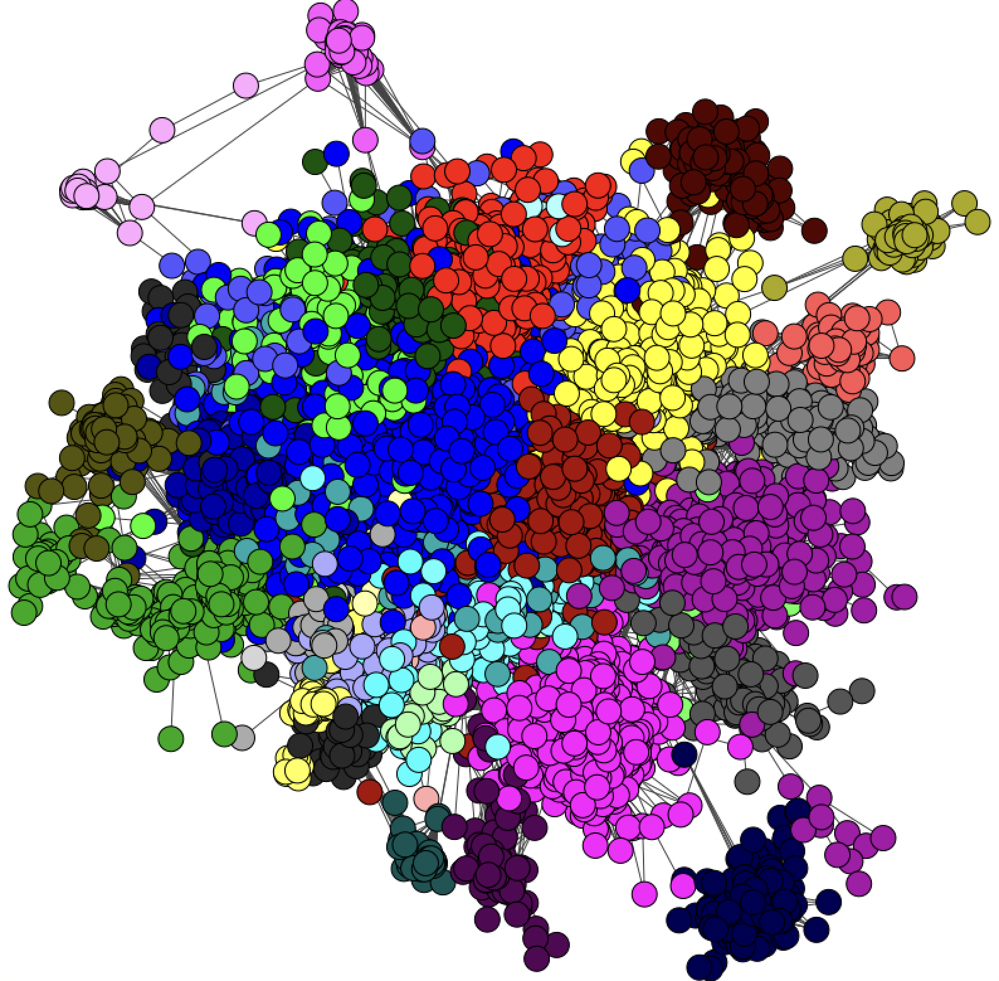

Community structure based on the multilevel algorithm of Blondel et al.

This is a bottom-up algorithm: initially every vertex belongs to a separate community, and vertices are moved between communities iteratively in a way that maximizes the vertices' local contribution to the overall modularity score. When a consensus is reached (i.e. no single move would increase the modularity score), every community in the original graph is shrank to a single vertex (while keeping the total weight of the adjacent edges) and the process continues on the next level. The algorithm stops when it is not possible to increase the modularity any more after shrinking the communities to vertices.


The identification of communities provide valuable insights into the underlying structure and organization of the actor's network. The communities reveal groups of nodes that are more closely related to each other. Communities can also reveal patterns of influence or information flow within a network, where nodes within a community may be more likely to influence or receive information from other nodes within the same community.

